In [3]:
# Obróbka danych (Data Processing) (70pkt) – jako doświadczony Data Scientist zapewne znasz poszczególne kroki, które należy wykonać na tym etapie, więc nie będziemy ich tutaj wyszczególniać.

In [4]:
import pandas as pd
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

In [5]:
df= pd.read_csv('Loan_data.csv')

C:\Users\Aldona\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (0,49) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


1. Obróbka danych (Data Processing) (70pkt)

In [6]:
df.head

<bound method NDFrame.head of             id  member_id  loan_amnt  funded_amnt  funded_amnt_inv  \
0      1077501        NaN     5000.0       5000.0           4975.0   
1      1077430        NaN     2500.0       2500.0           2500.0   
2      1077175        NaN     2400.0       2400.0           2400.0   
3      1076863        NaN    10000.0      10000.0          10000.0   
4      1075358        NaN     3000.0       3000.0           3000.0   
...        ...        ...        ...          ...              ...   
42531    73582        NaN     3500.0       3500.0            225.0   
42532    72998        NaN     1000.0       1000.0              0.0   
42533    72176        NaN     2525.0       2525.0            225.0   
42534    71623        NaN     6500.0       6500.0              0.0   
42535    70686        NaN     5000.0       5000.0              0.0   

             term int_rate  installment grade sub_grade  ...  \
0       36 months   10.65%       162.87     B        B2  ...   
1

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42536 entries, 0 to 42535
Columns: 151 entries, id to settlement_term
dtypes: float64(120), object(31)
memory usage: 49.0+ MB


In [8]:
df.describe(include='all')

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
count,42536.0,0.0,42535.000000,42535.000000,42535.000000,42535,42535,42535.000000,42535,42535,...,0.0,0.0,42535,42535,160,160,160,160.000000,160.000000,160.000000
unique,42536.0,NaN,NaN,NaN,NaN,2,394,NaN,7,35,...,NaN,NaN,1,2,63,3,61,NaN,NaN,NaN
top,655357.0,NaN,NaN,NaN,NaN,36 months,10.99%,NaN,B,B3,...,NaN,NaN,Cash,N,Jun-2017,COMPLETE,Sep-2013,NaN,NaN,NaN
freq,1.0,NaN,NaN,NaN,NaN,31534,970,NaN,12389,2997,...,NaN,NaN,42535,42375,18,142,8,NaN,NaN,NaN
mean,NaN,NaN,11089.722581,10821.585753,10139.938785,NaN,NaN,322.623063,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4272.137875,49.905875,1.200000
std,NaN,NaN,7410.938391,7146.914675,7131.598014,NaN,NaN,208.927216,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3119.373774,15.563690,4.085255
min,NaN,NaN,500.000000,500.000000,0.000000,NaN,NaN,15.670000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,193.290000,10.690000,0.000000
25%,NaN,NaN,5200.000000,5000.000000,4950.000000,NaN,NaN,165.520000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1842.750000,40.000000,0.000000
50%,NaN,NaN,9700.000000,9600.000000,8500.000000,NaN,NaN,277.690000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3499.350000,49.970000,0.000000
75%,NaN,NaN,15000.000000,15000.000000,14000.000000,NaN,NaN,428.180000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5701.100000,60.652500,0.000000


In [9]:
df.shape

(42536, 151)

In [10]:
brakujace_dane = df.isnull().sum().sort_values()
brakujace_dane.tail(50)

hardship_length                   42536
payment_plan_start_date           42536
hardship_end_date                 42536
hardship_start_date               42536
hardship_amount                   42536
deferral_term                     42536
tot_hi_cred_lim                   42536
open_acc_6m                       42536
open_act_il                       42536
percent_bc_gt_75                  42536
mo_sin_rcnt_rev_tl_op             42536
mo_sin_old_rev_tl_op              42536
mo_sin_old_il_acct                42536
open_il_12m                       42536
open_il_24m                       42536
bc_util                           42536
bc_open_to_buy                    42536
avg_cur_bal                       42536
acc_open_past_24mths              42536
inq_last_12m                      42536
total_cu_tl                       42536
mths_since_rcnt_il                42536
total_rev_hi_lim                  42536
all_util                          42536
max_bal_bc                        42536


In [11]:
df2=df
df2=df.dropna(axis=1,how='all')
df2.shape 

(42536, 69)

In [12]:
def oneCatElimination(dataframe):
    columns=df2.columns.values
    for column in columns:
        if len(df2[column].value_counts().unique())==1:
            del df2[column]
    return df2

In [13]:
oneCatElimination(df2)
df2.shape

(42536, 57)

In [14]:
df3=df2
df3.drop(axis = 1, columns = ['settlement_term', 'settlement_amount', 'settlement_date', 'settlement_status', 'debt_settlement_flag_date', 'settlement_percentage','mths_since_last_record','next_pymnt_d','tax_liens'], inplace= True)

C:\Users\Aldona\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [15]:
brakujace_dane = df2.isnull().sum().sort_values()
brakujace_dane.tail(10)

total_acc                    30
pub_rec                      30
earliest_cr_line             30
last_pymnt_d                 84
revol_util                   91
emp_length                 1113
pub_rec_bankruptcies       1366
emp_title                  2627
desc                      13294
mths_since_last_delinq    26927
dtype: int64

In [16]:
df3.drop(axis = 1, columns = ['mths_since_last_delinq'], inplace= True)

In [17]:
df3.info

<bound method DataFrame.info of        loan_amnt  funded_amnt  funded_amnt_inv        term int_rate  \
0         5000.0       5000.0           4975.0   36 months   10.65%   
1         2500.0       2500.0           2500.0   60 months   15.27%   
2         2400.0       2400.0           2400.0   36 months   15.96%   
3        10000.0      10000.0          10000.0   36 months   13.49%   
4         3000.0       3000.0           3000.0   60 months   12.69%   
...          ...          ...              ...         ...      ...   
42531     3500.0       3500.0            225.0   36 months   10.28%   
42532     1000.0       1000.0              0.0   36 months    9.64%   
42533     2525.0       2525.0            225.0   36 months    9.33%   
42534     6500.0       6500.0              0.0   36 months    8.38%   
42535     5000.0       5000.0              0.0   36 months    7.75%   

       installment grade sub_grade                   emp_title emp_length  \
0           162.87     B        B2    

In [18]:
df3.shape

(42536, 47)

In [19]:
brakujace_dane = df3.isnull().sum().sort_values()
brakujace_dane.tail(50)

loan_amnt                      1
last_fico_range_low            1
last_fico_range_high           1
last_pymnt_amnt                1
collection_recovery_fee        1
recoveries                     1
total_rec_late_fee             1
total_rec_int                  1
total_rec_prncp                1
total_pymnt_inv                1
total_pymnt                    1
revol_bal                      1
fico_range_high                1
dti                            1
addr_state                     1
zip_code                       1
fico_range_low                 1
home_ownership                 1
funded_amnt                    1
funded_amnt_inv                1
term                           1
int_rate                       1
installment                    1
grade                          1
sub_grade                      1
purpose                        1
debt_settlement_flag           1
loan_status                    1
issue_d                        1
verification_status            1
annual_inc

In [20]:
# df[['desc','emp_title']]=df[['desc','emp_title']].fillna(df[['desc','emp_title']].mode())
df3['desc']=df3['desc'].fillna(df3['desc'].mode()[0])
df3['pub_rec_bankruptcies']=df3['pub_rec_bankruptcies'].fillna(df3['pub_rec_bankruptcies'].mean())
df3['emp_title']=df3['emp_title'].fillna(df3['emp_title'].mode()[0])
df3['emp_length']=df3['emp_length'].fillna(df3['emp_length'].mode()[0])


<ipython-input-20-a2fa23b9f5ca>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['desc']=df3['desc'].fillna(df3['desc'].mode()[0])
<ipython-input-20-a2fa23b9f5ca>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['pub_rec_bankruptcies']=df3['pub_rec_bankruptcies'].fillna(df3['pub_rec_bankruptcies'].mean())
<ipython-input-20-a2fa23b9f5ca>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

In [21]:
brakujace_dane = df3.isnull().sum().sort_values()
brakujace_dane.tail(50)

emp_length                  0
pub_rec_bankruptcies        0
desc                        0
emp_title                   0
fico_range_high             1
revol_bal                   1
total_pymnt                 1
total_pymnt_inv             1
total_rec_prncp             1
loan_amnt                   1
total_rec_int               1
total_rec_late_fee          1
recoveries                  1
collection_recovery_fee     1
last_pymnt_amnt             1
last_fico_range_high        1
last_fico_range_low         1
dti                         1
addr_state                  1
fico_range_low              1
home_ownership              1
funded_amnt                 1
funded_amnt_inv             1
term                        1
int_rate                    1
installment                 1
grade                       1
sub_grade                   1
zip_code                    1
verification_status         1
debt_settlement_flag        1
issue_d                     1
loan_status                 1
purpose   

In [22]:
df3.dropna(how='any', axis = 0, inplace = True)
df3.shape

<ipython-input-22-4f676e4999ff>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3.dropna(how='any', axis = 0, inplace = True)


(42350, 47)

In [23]:
brakujace_dane = df3.isnull().sum().sort_values()
brakujace_dane.tail(50)

loan_amnt                  0
inq_last_6mths             0
open_acc                   0
pub_rec                    0
revol_bal                  0
revol_util                 0
total_acc                  0
total_pymnt                0
total_pymnt_inv            0
total_rec_prncp            0
fico_range_high            0
total_rec_int              0
recoveries                 0
collection_recovery_fee    0
last_pymnt_d               0
last_pymnt_amnt            0
last_credit_pull_d         0
last_fico_range_high       0
last_fico_range_low        0
acc_now_delinq             0
delinq_amnt                0
total_rec_late_fee         0
pub_rec_bankruptcies       0
fico_range_low             0
delinq_2yrs                0
funded_amnt                0
funded_amnt_inv            0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_title                  0
emp_length                 0
earliest_cr_li

In [24]:
df3.describe(include='all')

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,last_fico_range_high,last_fico_range_low,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,debt_settlement_flag
count,42350.000000,42350.000000,42350.000000,42350,42350,42350.000000,42350,42350,42350,42350,...,42350.000000,42350,42350.000000,42350,42350.000000,42350.000000,42350.000000,42350.000000,42350.000000,42350
unique,NaN,NaN,NaN,2,394,NaN,7,35,30537,11,...,NaN,112,NaN,133,NaN,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,36 months,10.99%,NaN,B,B3,US Army,10+ years,...,NaN,Mar-2013,NaN,Aug-2018,NaN,NaN,NaN,NaN,NaN,N
freq,NaN,NaN,NaN,31374,970,NaN,12355,2992,2735,10456,...,NaN,1068,NaN,9208,NaN,NaN,NaN,NaN,NaN,42190
mean,11109.211924,10840.211334,10162.364561,NaN,NaN,323.124979,NaN,NaN,NaN,NaN,...,14.261572,NaN,2623.355599,NaN,690.284628,677.473200,0.000094,0.143566,0.045197,NaN
std,7409.408311,7145.056871,7129.989790,NaN,NaN,208.872033,NaN,NaN,NaN,NaN,...,161.894388,NaN,4391.378244,NaN,80.309348,118.758544,0.009718,29.413604,0.205373,NaN
min,500.000000,500.000000,0.000000,NaN,NaN,15.670000,NaN,NaN,NaN,NaN,...,0.000000,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,5200.000000,5100.000000,4964.289886,NaN,NaN,165.740000,NaN,NaN,NaN,NaN,...,0.000000,NaN,213.085000,NaN,644.000000,640.000000,0.000000,0.000000,0.000000,NaN
50%,9800.000000,9600.000000,8500.000000,NaN,NaN,278.410000,NaN,NaN,NaN,NaN,...,0.000000,NaN,532.140000,NaN,699.000000,695.000000,0.000000,0.000000,0.000000,NaN
75%,15000.000000,15000.000000,14000.000000,NaN,NaN,428.907500,NaN,NaN,NaN,NaN,...,0.000000,NaN,3190.025000,NaN,749.000000,745.000000,0.000000,0.000000,0.000000,NaN


In [25]:
print(df3.to_csv('Loan_data_dp.csv'))


None


In [26]:
df= pd.read_csv('Loan_data_dp.csv')

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42350 entries, 0 to 42349
Data columns (total 48 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               42350 non-null  int64  
 1   loan_amnt                42350 non-null  float64
 2   funded_amnt              42350 non-null  float64
 3   funded_amnt_inv          42350 non-null  float64
 4   term                     42350 non-null  object 
 5   int_rate                 42350 non-null  object 
 6   installment              42350 non-null  float64
 7   grade                    42350 non-null  object 
 8   sub_grade                42350 non-null  object 
 9   emp_title                42350 non-null  object 
 10  emp_length               42350 non-null  object 
 11  home_ownership           42350 non-null  object 
 12  annual_inc               42350 non-null  float64
 13  verification_status      42350 non-null  object 
 14  issue_d               

In [28]:
df.shape

(42350, 48)

In [29]:
level_map = {' 36 months':36, ' 60 months':60}
df['term_new'] = df['term'].map(level_map)

In [30]:
level_map = {'A':1, 'B':2,'C':3,'D':4,'E':5,'F':6,'G':7}
df['grade_new'] = df['grade'].map(level_map)

In [31]:
level_map = {'10+ years':10, '< 1 year':0,'1 year':1,'2 years':2,'3 years':3,'4 years':4,'5 years':5,'6 years':6,'7 years':7,'8 years':8,'9 years':9}
df['emp_length_new'] = df['emp_length'].map(level_map)

In [32]:
level_map = {'RENT':1, 'MORTGAGE':2,'OWN':3,'OTHER':4,'NONE':5}
df['home_ownership_new'] = df['home_ownership'].map(level_map)

In [33]:
level_map = {'Not Verified':0, 'Verified':1,'Source Verified':2}
df['verification_status_new'] = df['verification_status'].map(level_map)

In [34]:

level_map = {'Fully Paid':1, 'Charged Off':0,'Does not meet the credit policy. Status:Fully Paid':1,'Does not meet the credit policy. Status:Charged Off':0}
df['loan_status_new'] = df['loan_status'].map(level_map)

In [35]:
def p2f(x):
    if type(x)== type('object'):
        return float(x.strip('%'))/100
    if type(x) == float:
        return x/100



In [36]:
df['int_rate_new'] = df.apply(lambda df: p2f(df['int_rate']), axis =  1)

In [37]:
def rule(x):
    if x == ' 36 months':
         return 36
    elif x==' 60 months':
         return 60

In [38]:
df['term_new'] = df.apply(lambda df: rule(df['term']), axis =  1)

In [39]:
df.int_rate_new

0        0.1065
1        0.1527
2        0.1596
3        0.1349
4        0.1269
          ...  
42345    0.1312
42346    0.1470
42347    0.0712
42348    0.1059
42349    0.0964
Name: int_rate_new, Length: 42350, dtype: float64

In [40]:
df.term_new

0        36
1        60
2        36
3        36
4        60
         ..
42345    36
42346    36
42347    36
42348    36
42349    36
Name: term_new, Length: 42350, dtype: int64

2. EDA, czyli obszerna eksploracja danych (100pkt) 

In [41]:

import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension

Requirement already up-to-date: pandas-profiling[notebook] in c:\users\aldona\anaconda3\lib\site-packages (2.11.0)
Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [42]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns

In [43]:
# profile = ProfileReport(df, title='Pandas Profiling Report_2', explorative=True)

In [44]:
# profile.to_file("your_report.html")

Opisz wnioski płynące z każdego wykresu:
loan_amnt - wartość Int, została dodana do danych zaimplementowanych do modelu predykcji. Najczęściej występująca wartość to 1000. 
funded_amnt - Int, została dodana do danych zaimplementowanych do modelu predykcji. Najczęściej występoca wartość to 1000.
funded_amnt_inv- Int, została dodana do danych zaimplementowanych do modelu predykcji. Najczęściej występoca wartość to 1000.
term -> term_new - Int, została dodana do danych zaimplementowanych do modelu predykcji. Występują 2 wartości 36 i 60, Najczęściej występująca to 36 (74%).
int_rate -> int_rate_new- Int, została dodana do danych zaimplementowanych do modelu predykcji.
installment - Int, została dodana do danych zaimplementowanych do modelu predykcji. Rozkład normalny. 
grade -> grade_new - Int, została dodana do danych zaimplementowanych do modelu predykcji. Najczęściej występuje wartość B (grade_new - 2).
sub_grade - string, nie zaimplementowana do modelu. 
emp_title - string, nie zaimplementowano do modelu.
emp_length -> emp_length_new - Int, została dodana do danych zaimplementowanych do modelu predykcji.Najczęściej występująca wartość 10.
home_ownership -> home_ownership_new - int, została dodana do danych zaimplementowanych do modelu predykcji. Najczęściej wysępująca wartość to  RENT. 
annual_inc - int, nie zaimplementowana do modelu. 
verification_status - string, nie zaimplementowano do modelowania.
issue_d - string - nie zaimplementowano do modelowania.
loan_status -> loan_status_new - string, zaimplementowano do modelu jako wartość modelowaną - Y
desc - string - nie zaimplementowano do modelu.
purpose - string nie zaimplementowano do modelu.
title - string nie zaimplementowano do modelu.
zip_code - string nie zaimplementowano do modelu.
addr_state - string nie zaimplementowano do modelu.
dti - int, została dodana do danych zaimplementowanych do modelu. 
delinq_2yrs - int, nie zaimplementowana do modelu. 
earliest_cr_line - string - nie zaimplementowano do modelowania.
fico_range_low, fico_range_high - int,zaimplementowano do modelu, rozkład normalny.
inq_last_6mths- int, nie zaimplementowana do modelu. 
open_acc - int,zaimplementowano do modelu, rozkład normalny.
pub_rec -  int, nie zaimplementowana do modelu.
revol_bal - int, nie zaimplementowana do modelu.
revol_util - string, nie zaimplementowano do modelu.
total_acc - int, nie zaimplementowano do modelu.
total_pymnt - int, została dodana do danych zaimplementowanych do modelu. 
total_pymnt_inv - int, nie zaimplementowano do modelu.
total_rec_prncp - int, nie zaimplementowano do modelu.
total_rec_int - int, nie zaimplementowano do modelu.
total_rec_late_fee - int, nie zaimplementowano do modelu.
recoveries - int, nie zaimplementowano do modelu.
collection_recovery_fee - int, nie zaimplementowano do modelu.
last_pymnt_d - string, nie zaimplementowano do modelu.
last_pymnt_amnt -int, nie zaimplementowano do modelu.
last_credit_pull_d - string, nie zaimplementowano do modelu.
last_fico_range_high, last_fico_range_low - int,zaimplementowano do modelu, rozkład normalny.
acc_now_delinq - float, nie zaimplementowano do modelu, dane jednorodne.
delinq_amnt - float, nie zaimplementowano do modelu, dane jednorodne.
pub_rec_bankruptcies - float, nie zaimplementowano do modelu, dane jednorodne.
debt_settlement_flag - string, nie zaimplementowano do modelu.


W jaki sposób wynik FICO wiąże się z prawdopodobieństwem spłacenia pożyczki przez pożyczkobiorcę?
W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO
W jaki sposób status kredytu hipotecznego na dom wiąże się z prawdopodobieństwem niewypłacalności?
W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?
W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?
Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?

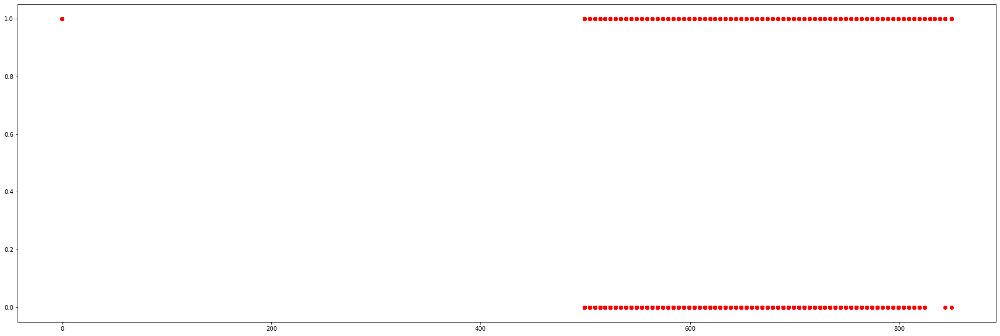

In [45]:
# W jaki sposób wynik FICO wiąże się z prawdopodobieństwem spłacenia pożyczki przez pożyczkobiorcę?
plt.figure(figsize=(30,10))
plt.scatter(df['last_fico_range_high'], df['loan_status_new'],  color='red')

In [46]:
def rule(x):
    if x <580:
         return 1
    elif x <=670 and x > 580 :
         return 2
    elif x <=739 and x > 670:
        return 3
    elif x <=799 and x >740:
        return 4
    elif x > 800:
        return 5    

In [47]:
df['last_fico_range_high_new'] = df.apply(lambda df: rule(df['last_fico_range_high']), axis =  1)

Wynik FICO na podstawie wykresu można wniosokować że nie są silnie powiązane. Wyraźnie jednak widać że w zakresie FICO od ok 800 prawdopodobieństwo spłaty pożyczki jest większe. 

In [48]:
df_count_by_fico=df.groupby('last_fico_range_high_new').count()
df_count_by_fico

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,delinq_amnt,pub_rec_bankruptcies,debt_settlement_flag,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,loan_status_new,int_rate_new
last_fico_range_high_new,,,,,,,,,,,,,,,,,,,,,
1,4760,4760,4760,4760,4760,4760,4760,4760,4760,4760,...,4760,4760,4760,4760,4760,4760,4760,4760,4760,4760
2,10194,10194,10194,10194,10194,10194,10194,10194,10194,10194,...,10194,10194,10194,10194,10194,10194,10194,10194,10194,10194
3,15531,15531,15531,15531,15531,15531,15531,15531,15531,15531,...,15531,15531,15531,15531,15531,15531,15531,15531,15531,15531
4,9247,9247,9247,9247,9247,9247,9247,9247,9247,9247,...,9247,9247,9247,9247,9247,9247,9247,9247,9247,9247
5,2618,2618,2618,2618,2618,2618,2618,2618,2618,2618,...,2618,2618,2618,2618,2618,2618,2618,2618,2618,2618


In [49]:
df[(df['last_fico_range_high_new']==5)&(df['loan_status_new']==0)].count()

Unnamed: 0                  22
loan_amnt                   22
funded_amnt                 22
funded_amnt_inv             22
term                        22
int_rate                    22
installment                 22
grade                       22
sub_grade                   22
emp_title                   22
emp_length                  22
home_ownership              22
annual_inc                  22
verification_status         22
issue_d                     22
loan_status                 22
desc                        22
purpose                     22
title                       22
zip_code                    22
addr_state                  22
dti                         22
delinq_2yrs                 22
earliest_cr_line            22
fico_range_low              22
fico_range_high             22
inq_last_6mths              22
open_acc                    22
pub_rec                     22
revol_bal                   22
revol_util                  22
total_acc                   22
total_py

In [50]:
#Prawdopodobnieństwo niespłacenia pożyczki w zależności od FICO
print('Prawdopodobieństwo niespłacenia pożyczki przy FICO =1:',2341/4760)
print('Prawdopodobieństwo niespłacenia pożyczki przy FICO =2:',2991/10194)
print('Prawdopodobieństwo niespłacenia pożyczki przy FICO =3:',873/15531)
print('Prawdopodobieństwo niespłacenia pożyczki przy FICO =4:',99/9247)
print('Prawdopodobieństwo niespłacenia pożyczki przy FICO =5:',22/2618)

Prawdopodobieństwo niespłacenia pożyczki przy FICO =1: 0.4918067226890756
Prawdopodobieństwo niespłacenia pożyczki przy FICO =2: 0.29340788699234843
Prawdopodobieństwo niespłacenia pożyczki przy FICO =3: 0.056210160324512266
Prawdopodobieństwo niespłacenia pożyczki przy FICO =4: 0.010706174975667785
Prawdopodobieństwo niespłacenia pożyczki przy FICO =5: 0.008403361344537815


W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO

Z poniższego wykresu trudno wnioskować zależność pomiedzy wiekiem kredytowym (tu interpretowanym jako długość pożyczki) a prawdopodobieństwem spłaty pożyczki. Dlatego prawdopodobieństwo zostało obliczone i z obliczeń wynika że prawdopodobieństwo niespłacenia pożyczki jest wyższe przy kredycie na 60 miesięcy.
Prawdopodobieństwo niespłacenia pożyczki przy kredycie na 36 miesięcy wynosi: 0.23
Prawdopodobieństwo niespłacenia pożyczki przy kredycie na 36 miesięcy wynosi: 0.12



In [51]:
df_count_by_36=df.groupby('loan_status_new').count()
df_count_by_36


,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,delinq_amnt,pub_rec_bankruptcies,debt_settlement_flag,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,int_rate_new,last_fico_range_high_new
loan_status_new,,,,,,,,,,,,,,,,,,,,,
0,6326,6326,6326,6326,6326,6326,6326,6326,6326,6326,...,6326,6326,6326,6326,6326,6326,6326,6326,6326,6326
1,36024,36024,36024,36024,36024,36024,36024,36024,36024,36024,...,36024,36024,36024,36024,36024,36024,36024,36024,36024,36024


In [52]:
df[(df['term_new']==36)&(df['loan_status_new']==0)].count()

Unnamed: 0                  3793
loan_amnt                   3793
funded_amnt                 3793
funded_amnt_inv             3793
term                        3793
int_rate                    3793
installment                 3793
grade                       3793
sub_grade                   3793
emp_title                   3793
emp_length                  3793
home_ownership              3793
annual_inc                  3793
verification_status         3793
issue_d                     3793
loan_status                 3793
desc                        3793
purpose                     3793
title                       3793
zip_code                    3793
addr_state                  3793
dti                         3793
delinq_2yrs                 3793
earliest_cr_line            3793
fico_range_low              3793
fico_range_high             3793
inq_last_6mths              3793
open_acc                    3793
pub_rec                     3793
revol_bal                   3793
revol_util

In [53]:
df[(df['term_new']==60)&(df['loan_status_new']==0)].count()


Unnamed: 0                  2533
loan_amnt                   2533
funded_amnt                 2533
funded_amnt_inv             2533
term                        2533
int_rate                    2533
installment                 2533
grade                       2533
sub_grade                   2533
emp_title                   2533
emp_length                  2533
home_ownership              2533
annual_inc                  2533
verification_status         2533
issue_d                     2533
loan_status                 2533
desc                        2533
purpose                     2533
title                       2533
zip_code                    2533
addr_state                  2533
dti                         2533
delinq_2yrs                 2533
earliest_cr_line            2533
fico_range_low              2533
fico_range_high             2533
inq_last_6mths              2533
open_acc                    2533
pub_rec                     2533
revol_bal                   2533
revol_util

In [54]:
#Prawdopodobnieństwo niespłacenia pożyczki 36
print('Prawdopodobieństwo niespłacenia pożyczki przy kredycie na 36 miesięcy wynosi:',3793/31374)

Prawdopodobieństwo niespłacenia pożyczki przy kredycie na 36 miesięcy wynosi: 0.12089628354688596


In [55]:
#Prawdopodobnieństwo niespłacenia pożyczki 60
print('Prawdopodobieństwo niespłacenia pożyczki przy kredycie na 60 miesięcy wynosi:',2533/10976)

Prawdopodobieństwo niespłacenia pożyczki przy kredycie na 60 miesięcy wynosi: 0.23077623906705538


In [56]:
df_heatmap= df[['term_new','loan_status_new','last_fico_range_high_new']]

<AxesSubplot:>

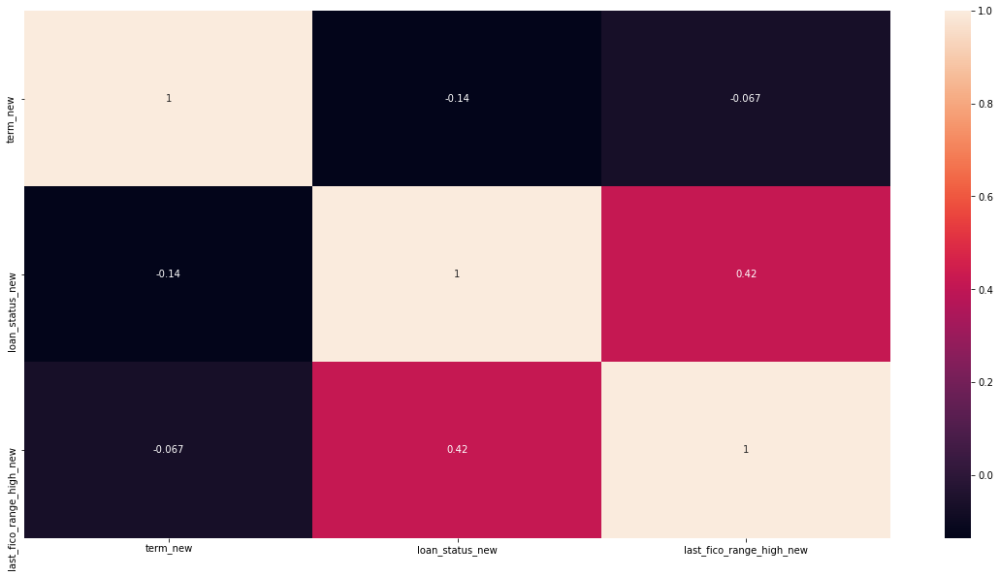

In [57]:
plt.figure(figsize = (20,10))       
sns.heatmap(df_heatmap.corr(),annot = True)

W jaki sposób wiek kredytowy wiąże się z prawdopodobieństwem niewykonania zobowiązania i czy ryzyko to jest niezależne lub związane z wynikiem FICO?
Wiek kredytowy, który został przeze mnie zinterpretowany jako kolumna term, zamieniona na int na kolumnę term_new, jest zwiazany nie jest silnie skorelowany prawdopodobieństwem spłacenia lub niespłacenia pożyczki (-0,14), prawdopodobnieństwo niespłacenia jest wyższe dla dłuższego terminu pożyczki. 
Z mapy korealcji wynika również że ryzyko niespłacenia zobowiązania jest skorelowane z FICO. Im wyższe FICO tym mniejsze prawdopodobieństwo spłacenia pożyczki. 

In [58]:
df.groupby('home_ownership').count()

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,pub_rec_bankruptcies,debt_settlement_flag,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,loan_status_new,int_rate_new,last_fico_range_high_new
home_ownership,,,,,,,,,,,,,,,,,,,,,
MORTGAGE,18917,18917,18917,18917,18917,18917,18917,18917,18917,18917,...,18917,18917,18917,18917,18917,18917,18917,18917,18917,18917
NONE,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
OTHER,134,134,134,134,134,134,134,134,134,134,...,134,134,134,134,134,134,134,134,134,134
OWN,3235,3235,3235,3235,3235,3235,3235,3235,3235,3235,...,3235,3235,3235,3235,3235,3235,3235,3235,3235,3235
RENT,20060,20060,20060,20060,20060,20060,20060,20060,20060,20060,...,20060,20060,20060,20060,20060,20060,20060,20060,20060,20060


In [59]:
df[(df['home_ownership']=='RENT')&(df['loan_status_new']==0)].count()

Unnamed: 0                  3132
loan_amnt                   3132
funded_amnt                 3132
funded_amnt_inv             3132
term                        3132
int_rate                    3132
installment                 3132
grade                       3132
sub_grade                   3132
emp_title                   3132
emp_length                  3132
home_ownership              3132
annual_inc                  3132
verification_status         3132
issue_d                     3132
loan_status                 3132
desc                        3132
purpose                     3132
title                       3132
zip_code                    3132
addr_state                  3132
dti                         3132
delinq_2yrs                 3132
earliest_cr_line            3132
fico_range_low              3132
fico_range_high             3132
inq_last_6mths              3132
open_acc                    3132
pub_rec                     3132
revol_bal                   3132
revol_util

#Prawdopodobnieństwo niespłacenia dla statusu MORTRAGE
print('Prawdopodobieństwo niespłacenia pożyczki dla statusu MORTRAGE:',2676/18917),
#Prawdopodobnieństwo niespłacenia dla statusu OWN
print('Prawdopodobieństwo niespłacenia pożyczki dla statusu OWN:',488/3235)
#Prawdopodobnieństwo niespłacenia dla statusu RENT
print('Prawdopodobieństwo niespłacenia pożyczki dla statusu RENT:',3132/20060)

Z powyszych obliczeń wynika że prawdpodobieństwo niewiele różni sie w zależności od statusu kredytu hipotecznego.

W jaki sposób roczny dochód wiąże się z prawdopodobieństwem niewykonania zobowiązania?

In [60]:
def rule(x):
    if x <50000:
         return 1
    elif x <=80000 and x > 50000 :
         return 2
    elif x <=120000 and x > 80000:
        return 3
    elif x > 120000:
        return 4    

In [61]:
df['annual_inc_new'] = df.apply(lambda df: rule(df['annual_inc']), axis =  1)

In [62]:
df_ai=df.groupby('annual_inc_new').count()
df_ai

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,pub_rec_bankruptcies,debt_settlement_flag,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,loan_status_new,int_rate_new,last_fico_range_high_new
annual_inc_new,,,,,,,,,,,,,,,,,,,,,
1.0,15740,15740,15740,15740,15740,15740,15740,15740,15740,15740,...,15740,15740,15740,15740,15740,15740,15740,15740,15740,15740
2.0,14406,14406,14406,14406,14406,14406,14406,14406,14406,14406,...,14406,14406,14406,14406,14406,14406,14406,14406,14406,14406
3.0,7539,7539,7539,7539,7539,7539,7539,7539,7539,7539,...,7539,7539,7539,7539,7539,7539,7539,7539,7539,7539
4.0,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553,...,3553,3553,3553,3553,3553,3553,3553,3553,3553,3553


In [63]:
df[(df['annual_inc_new']==4)&(df['loan_status_new']==0)].count()

Unnamed: 0                  427
loan_amnt                   427
funded_amnt                 427
funded_amnt_inv             427
term                        427
int_rate                    427
installment                 427
grade                       427
sub_grade                   427
emp_title                   427
emp_length                  427
home_ownership              427
annual_inc                  427
verification_status         427
issue_d                     427
loan_status                 427
desc                        427
purpose                     427
title                       427
zip_code                    427
addr_state                  427
dti                         427
delinq_2yrs                 427
earliest_cr_line            427
fico_range_low              427
fico_range_high             427
inq_last_6mths              427
open_acc                    427
pub_rec                     427
revol_bal                   427
revol_util                  427
total_ac

In [64]:
#Prawdopodobnieństwo niespłacenia pożyczki w zależności od annual_inc
print('Prawdopodobieństwo niespłacenia pożyczki przy annual_inc <50000:',2733/15740)
print('Prawdopodobieństwo niespłacenia pożyczki przy 80000 <= annual_inc > 50000:',2103/14406)
print('Prawdopodobieństwo niespłacenia pożyczki przy 120000 <= annual_inc 80000:',883/7539)
print('Prawdopodobieństwo niespłacenia pożyczki przy annual_inc > 120000:',427/3553)



Prawdopodobieństwo niespłacenia pożyczki przy annual_inc <50000: 0.17363405336721727
Prawdopodobieństwo niespłacenia pożyczki przy 80000 <= annual_inc > 50000: 0.14598084131611827
Prawdopodobieństwo niespłacenia pożyczki przy 120000 <= annual_inc 80000: 0.11712428704072159
Prawdopodobieństwo niespłacenia pożyczki przy annual_inc > 120000: 0.12018012946805516


Wg podanych prawdopodobnieńtw Prawdopodobieństwo niespałcenia pożyczki istnieje wśród ludzi najmnniej zarabiających, niewykluczam niewłaściwego doboru grup, ale prawdopodobnieńśtwa nie róznia sie istotnie między poszczególnymi grupami. 

<AxesSubplot:ylabel='Frequency'>

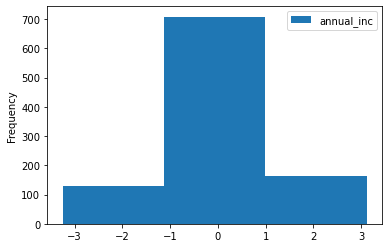

In [65]:
df_aihist=pd.DataFrame({'annual_inc':np.random.randn(1000)}, 
    columns=['annual_inc'])

df_aihist.plot.hist(bins=3)

W jaki sposób historia zatrudnienia wiąże się z prawdopodobieństwem niewykonania zobowiązania?

In [66]:
df.groupby('emp_length_new').count()

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,pub_rec_bankruptcies,debt_settlement_flag,term_new,grade_new,home_ownership_new,verification_status_new,loan_status_new,int_rate_new,last_fico_range_high_new,annual_inc_new
emp_length_new,,,,,,,,,,,,,,,,,,,,,
0,5017,5017,5017,5017,5017,5017,5017,5017,5017,5017,...,5017,5017,5017,5017,5017,5017,5017,5017,5017,4861
1,3571,3571,3571,3571,3571,3571,3571,3571,3571,3571,...,3571,3571,3571,3571,3571,3571,3571,3571,3571,3470
2,4728,4728,4728,4728,4728,4728,4728,4728,4728,4728,...,4728,4728,4728,4728,4728,4728,4728,4728,4728,4613
3,4351,4351,4351,4351,4351,4351,4351,4351,4351,4351,...,4351,4351,4351,4351,4351,4351,4351,4351,4351,4234
4,3631,3631,3631,3631,3631,3631,3631,3631,3631,3631,...,3631,3631,3631,3631,3631,3631,3631,3631,3631,3528
5,3441,3441,3441,3441,3441,3441,3441,3441,3441,3441,...,3441,3441,3441,3441,3441,3441,3441,3441,3441,3328
6,2366,2366,2366,2366,2366,2366,2366,2366,2366,2366,...,2366,2366,2366,2366,2366,2366,2366,2366,2366,2313
7,1870,1870,1870,1870,1870,1870,1870,1870,1870,1870,...,1870,1870,1870,1870,1870,1870,1870,1870,1870,1803
8,1585,1585,1585,1585,1585,1585,1585,1585,1585,1585,...,1585,1585,1585,1585,1585,1585,1585,1585,1585,1533


In [67]:
def rule(x):
    if x <= 2:
         return 1
    elif x <=5 and x > 2 :
         return 2
    elif x < 9 and x > 5:
        return 3
    elif x > 9:
        return 4 


In [68]:
df['emp_length_new2'] = df.apply(lambda df: rule(df['emp_length_new']), axis =  1)

In [69]:
df_ai2=df.groupby('emp_length_new2').count()
df_ai2

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,debt_settlement_flag,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,loan_status_new,int_rate_new,last_fico_range_high_new,annual_inc_new
emp_length_new2,,,,,,,,,,,,,,,,,,,,,
1.0,13316,13316,13316,13316,13316,13316,13316,13316,13316,13316,...,13316,13316,13316,13316,13316,13316,13316,13316,13316,12944
2.0,11423,11423,11423,11423,11423,11423,11423,11423,11423,11423,...,11423,11423,11423,11423,11423,11423,11423,11423,11423,11090
3.0,5821,5821,5821,5821,5821,5821,5821,5821,5821,5821,...,5821,5821,5821,5821,5821,5821,5821,5821,5821,5649
4.0,10456,10456,10456,10456,10456,10456,10456,10456,10456,10456,...,10456,10456,10456,10456,10456,10456,10456,10456,10456,10258


In [70]:
df[(df['emp_length_new2']==1)&(df['loan_status_new']==0)].count()

Unnamed: 0                  1915
loan_amnt                   1915
funded_amnt                 1915
funded_amnt_inv             1915
term                        1915
int_rate                    1915
installment                 1915
grade                       1915
sub_grade                   1915
emp_title                   1915
emp_length                  1915
home_ownership              1915
annual_inc                  1915
verification_status         1915
issue_d                     1915
loan_status                 1915
desc                        1915
purpose                     1915
title                       1915
zip_code                    1915
addr_state                  1915
dti                         1915
delinq_2yrs                 1915
earliest_cr_line            1915
fico_range_low              1915
fico_range_high             1915
inq_last_6mths              1915
open_acc                    1915
pub_rec                     1915
revol_bal                   1915
revol_util

Jak wielkość żądanej pożyczki jest powiązana z prawdopodobieństwem niewykonania zobowiązania?

In [71]:
#Prawdopodobnieństwo niespłacenia pożyczki w zależności od długości zatrudnienia
print('Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia < 2 lata:',1915/8588)
print('Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia < 5 lata:',1631/11423)
print('Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia < 9 lata:',873/5821)
print('Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia > 9 lata:',1731/10456)

Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia < 2 lata: 0.2229855612482534
Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia < 5 lata: 0.14278210627680996
Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia < 9 lata: 0.14997423123174713
Prawdopodobieństwo niespłacenia pożyczki przy długość zatrudnienia > 9 lata: 0.16555087987758224


Prawdopodobnieństwo niespłacenia pozyczki jest największe dla osób z najmniejszym doswiadczeniem. Pozostałe poziomy niewiele różnią się od siebie, tylko osoby mające mniejsze doświadczenie niż 2 lata spłącają pożyczkę żadziej. W dalszej analizie przyjrzałabym się temu segementowi, żeby szczegółowo sprawdzić jakich osób dotyczy większe Prawdopodobnieństwo niespłacenia pozyczki. 

In [72]:
df_loan_amnt=df.groupby('loan_amnt').count()
df_loan_amnt.sort_values(by ='funded_amnt', ascending=True)

,Unnamed: 0,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,loan_status_new,int_rate_new,last_fico_range_high_new,annual_inc_new,emp_length_new2
loan_amnt,,,,,,,,,,,,,,,,,,,,,
23425.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
14225.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
9650.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
14175.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
14150.0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15000.0,2010,2010,2010,2010,2010,2010,2010,2010,2010,2010,...,2010,2010,2010,2010,2010,2010,2010,2010,1957,1931
6000.0,2033,2033,2033,2033,2033,2033,2033,2033,2033,2033,...,2033,2033,2033,2033,2033,2033,2033,2033,1960,1986
5000.0,2246,2246,2246,2246,2246,2246,2246,2246,2246,2246,...,2246,2246,2246,2246,2246,2246,2246,2246,2178,2179


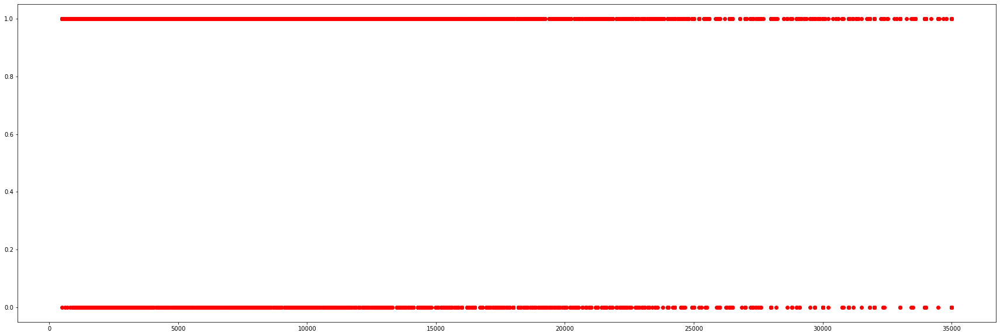

In [73]:
plt.figure(figsize=(30,10))
plt.scatter(df['loan_amnt'], df['loan_status_new'],  color='red')

Z wykresu można wnioskować że spłata pożyczki jest bardziej prawdopodobna u osób które biorą większe zobowiązania. Im więsza pożyczka tym mniejsze prawdopodobieńśtwo spłaty.

In [74]:
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

<AxesSubplot:xlabel='int_rate_new'>

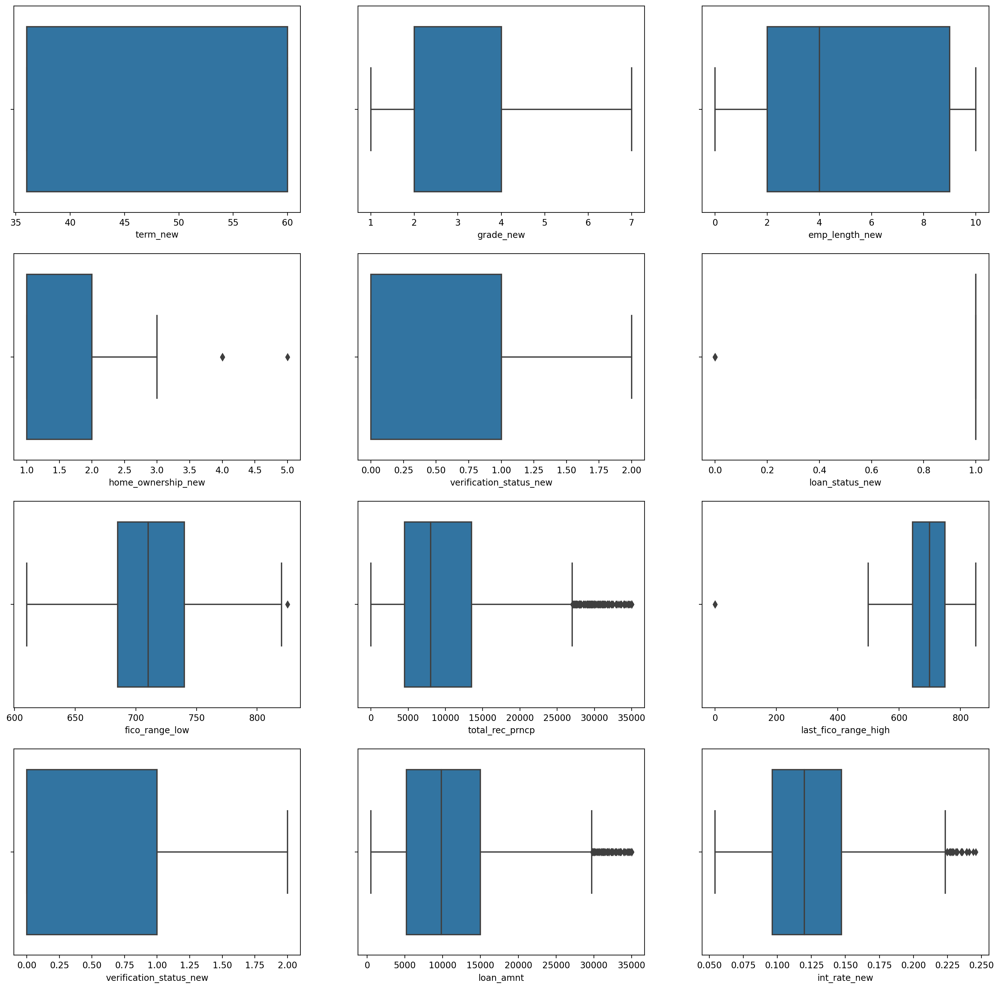

In [75]:
# sprawdzamy outliersy

plt.figure(figsize=(20,20), dpi=200)

plt.subplot(4,3,1)
sns.boxplot(x = 'term_new', data = df)

plt.subplot(4,3,2)
sns.boxplot(x = 'grade_new', data = df)

plt.subplot(4,3,3)
sns.boxplot(x = 'emp_length_new', data = df)

plt.subplot(4,3,4)
sns.boxplot(x = 'home_ownership_new', data = df)

plt.subplot(4,3,5)
sns.boxplot(x = 'verification_status_new', data = df)

plt.subplot(4,3,6)
sns.boxplot(x = 'loan_status_new', data = df)

plt.subplot(4,3,7)
sns.boxplot(x = 'fico_range_low', data = df)

plt.subplot(4,3,8)
sns.boxplot(x = 'total_rec_prncp', data = df)

plt.subplot(4,3,9)
sns.boxplot(x = 'last_fico_range_high', data = df)

plt.subplot(4,3,10)
sns.boxplot(x = 'verification_status_new', data = df)

plt.subplot(4,3,11)
sns.boxplot(x = 'loan_amnt', data = df)

plt.subplot(4,3,12)
sns.boxplot(x = 'int_rate_new', data = df)


In [76]:
df.head

<bound method NDFrame.head of        Unnamed: 0  loan_amnt  funded_amnt  funded_amnt_inv        term  \
0               0     5000.0       5000.0           4975.0   36 months   
1               1     2500.0       2500.0           2500.0   60 months   
2               2     2400.0       2400.0           2400.0   36 months   
3               3    10000.0      10000.0          10000.0   36 months   
4               4     3000.0       3000.0           3000.0   60 months   
...           ...        ...          ...              ...         ...   
42345       42508     6000.0       6000.0           1200.0   36 months   
42346       42511    10000.0      10000.0            350.0   36 months   
42347       42512     2000.0       2000.0           1275.0   36 months   
42348       42513     6000.0       6000.0            650.0   36 months   
42349       42514     4400.0       4400.0           1400.0   36 months   

      int_rate  installment grade sub_grade  \
0       10.65%       162.87     B 

In [77]:
from scipy import stats

z = np.abs(stats.zscore(df[['loan_amnt', 'funded_amnt', 'term_new', 'int_rate_new', 'installment','grade_new', 'emp_length_new', 'home_ownership_new', 'verification_status_new','dti','fico_range_low','open_acc','total_pymnt','total_rec_prncp','last_fico_range_low','funded_amnt_inv', 'Unnamed: 0']]))
print(z)

print("\n")
print("*******************************************************************************")
print("\n")

# threshold = 3  # selecting 3 as the threshold to identify outliers
print('Ponizej sa punkty odstajace - nr indeksow i odpowiadające im indeksy kolumn w drugim wektorze')
print("\n")
print(np.where(z > 3))

[[0.82453062 0.81738752 0.59147597 ... 0.48440708 0.72755024 1.73079329]
 [1.16194347 1.16728389 1.69068577 ... 5.70469438 1.07467966 1.73071176]
 [1.17543998 1.18127975 0.59147597 ... 0.48440708 1.08870509 1.73063024]
 ...
 [1.22942603 1.23726317 0.59147597 ... 1.07384532 1.24649119 1.73497393]
 [0.68956549 0.67742896 0.59147597 ... 0.73702347 1.33415014 1.73505546]
 [0.90550971 0.90136265 0.59147597 ... 1.1154967  1.22895941 1.73513698]]


*******************************************************************************


Ponizej sa punkty odstajace - nr indeksow i odpowiadające im indeksy kolumn w drugim wektorze


(array([    1,     8,    24, ..., 42340, 42340, 42346], dtype=int64), array([14, 14, 14, ...,  5, 14, 14], dtype=int64))


In [78]:
df3 = df.drop('loan_status_new',axis =1)  
df3.head

<bound method NDFrame.head of        Unnamed: 0  loan_amnt  funded_amnt  funded_amnt_inv        term  \
0               0     5000.0       5000.0           4975.0   36 months   
1               1     2500.0       2500.0           2500.0   60 months   
2               2     2400.0       2400.0           2400.0   36 months   
3               3    10000.0      10000.0          10000.0   36 months   
4               4     3000.0       3000.0           3000.0   60 months   
...           ...        ...          ...              ...         ...   
42345       42508     6000.0       6000.0           1200.0   36 months   
42346       42511    10000.0      10000.0            350.0   36 months   
42347       42512     2000.0       2000.0           1275.0   36 months   
42348       42513     6000.0       6000.0            650.0   36 months   
42349       42514     4400.0       4400.0           1400.0   36 months   

      int_rate  installment grade sub_grade  \
0       10.65%       162.87     B 

In [79]:
df_outliers_removed = df3[(z<3).all(axis=1)]

In [80]:
df_outliers_removed.shape

(39542, 57)

Pozwolę sobie wytłumaczyć co się wydarzyło poniżej. Próbując dopasować kształt df_outliers_removed do df_y, które jest DataFrame z 2 kolumnami, nie chcąc eliminować ouliersów z kolumny y postanowiłam na podstawie ID usunąć, a raczej zostawić ID z kolumny Unnamed:0 w celu pozostawienia korespondujących danych. W ten sposób uzyskałam kolumnę y, która odpowiada danym z usuniętymi outlinersami. 

In [81]:
df_y=df[['loan_status_new', 'Unnamed: 0']]

In [82]:
df_y

,loan_status_new,Unnamed: 0
0,1,0
1,0,1
2,1,2
3,1,3
4,1,4
...,...,...
42345,1,42508
42346,1,42511
42347,1,42512
42348,1,42513


In [83]:
listID=df_outliers_removed['Unnamed: 0']
listID

0            0
2            2
3            3
4            4
5            5
         ...  
42344    42507
42345    42508
42347    42512
42348    42513
42349    42514
Name: Unnamed: 0, Length: 39542, dtype: int64

In [84]:
new_df = df_y[df_y['Unnamed: 0'].isin(listID)]

In [85]:
new_df

,loan_status_new,Unnamed: 0
0,1,0
2,1,2
3,1,3
4,1,4
5,1,5
...,...,...
42344,1,42507
42345,1,42508
42347,1,42512
42348,1,42513


In [86]:
df2=df
df2=df3[['loan_amnt', 'funded_amnt', 'term_new', 'int_rate_new', 'installment','grade_new', 'emp_length_new', 'home_ownership_new', 'verification_status_new','dti','fico_range_low','open_acc','total_pymnt','total_rec_prncp','last_fico_range_low', 'funded_amnt_inv']]

Do modelowania wybrałam powyższe kolumny, wynikało to z analizy danych na podstawie EDA i pandas profiling (plik zamieszczony w repozytorium)

In [87]:
df2_outliers_removed = df2[(z<3).all(axis=1)]
df2_outliers_removed.shape

(39542, 16)

In [88]:
X = df2_outliers_removed
y = new_df.drop(['Unnamed: 0'], axis=1)

In [89]:
X.shape


(39542, 16)

In [90]:
y.shape

(39542, 1)

In [91]:
y.value_counts()

loan_status_new
1                  34117
0                   5425
dtype: int64

In [92]:
## PCA
## wykonanie standaryzacji przed zastosowaniem PCA
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [93]:
X.columns

Index(['loan_amnt', 'funded_amnt', 'term_new', 'int_rate_new', 'installment',
       'grade_new', 'emp_length_new', 'home_ownership_new',
       'verification_status_new', 'dti', 'fico_range_low', 'open_acc',
       'total_pymnt', 'total_rec_prncp', 'last_fico_range_low',
       'funded_amnt_inv'],
      dtype='object')

In [94]:
X_scaled_df = pd.DataFrame(X_scaled,columns=X.columns)

In [95]:
X_scaled_df.head()

,loan_amnt,funded_amnt,term_new,int_rate_new,installment,grade_new,emp_length_new,home_ownership_new,verification_status_new,dti,fico_range_low,open_acc,total_pymnt,total_rec_prncp,last_fico_range_low,funded_amnt_inv
0,-0.843525,-0.835897,-0.56744,-0.351413,-0.770419,-0.417012,1.377437,-0.948859,0.255789,2.131662,0.587263,-1.488005,-0.702888,-0.678210,0.589564,-0.740851
1,-1.242662,-1.249469,-0.56744,1.149049,-1.189757,0.332817,1.377437,-0.948859,-0.979784,-0.687061,0.587263,-1.729586,-1.067006,-1.090428,0.589564,-1.151147
2,-0.075954,-0.040566,-0.56744,0.451094,0.171624,0.332817,1.377437,-0.948859,1.491361,0.992559,-0.662312,0.203067,0.108654,0.114517,-1.199845,0.059824
3,-1.150553,-1.154029,1.76230,0.225035,-1.278067,-0.417012,-1.118983,-0.948859,1.491361,0.685820,-0.523470,1.410976,-0.931776,-0.995300,-0.139454,-1.055544
4,-0.843525,-0.835897,-0.56744,-1.128489,-0.804643,-1.166842,-0.564223,-0.948859,1.491361,-0.317783,0.448421,-0.038514,-0.732316,-0.678210,-1.730040,-0.736867


<AxesSubplot:>

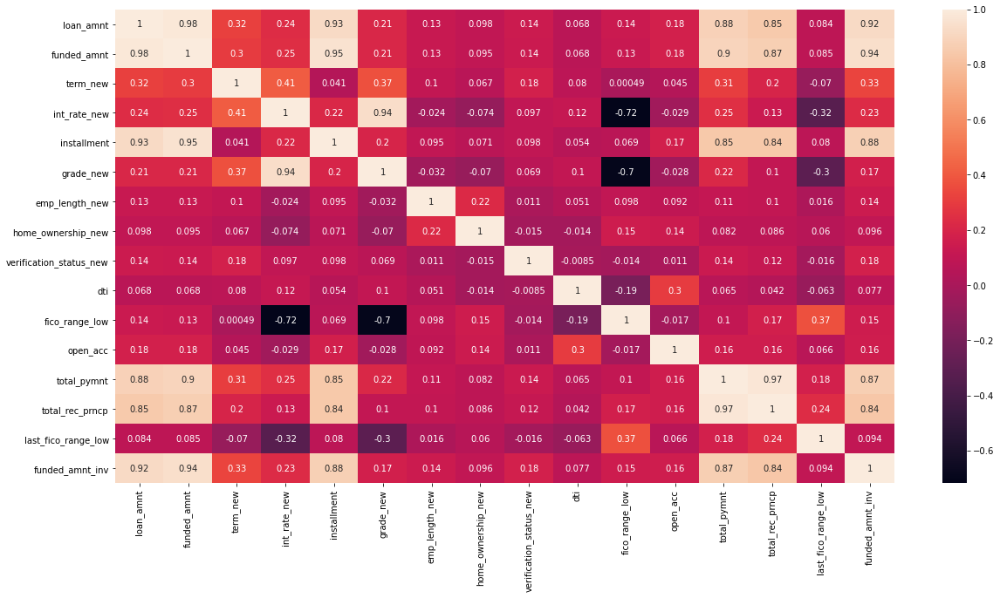

In [96]:
plt.figure(figsize = (20,10))       
sns.heatmap(X_scaled_df.corr(),annot = True)

In [97]:
from sklearn.decomposition import PCA
pca = PCA(random_state=42)
# pca_final = IncrementalPCA(n_components=0.90,svd_solver='full')
pca.fit(X_scaled)

PCA(random_state=42)

In [98]:
pca.components_[0]

array([0.39943142, 0.40446136, 0.14723514, 0.13754645, 0.38198579,
       0.12188834, 0.06389856, 0.04761521, 0.0756932 , 0.042761  ,
       0.0276395 , 0.087299  , 0.39265598, 0.37904766, 0.04517416,
       0.39154645])

In [99]:
pca.explained_variance_ratio_

array([0.36528628, 0.1802972 , 0.08458102, 0.07448525, 0.06416481,
       0.05364452, 0.05040939, 0.04720668, 0.03985834, 0.01660659,
       0.0111234 , 0.00593927, 0.00315315, 0.00186637, 0.00094223,
       0.00043549])

In [100]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.36528628, 0.54558348, 0.6301645 , 0.70464975, 0.76881456,
       0.82245908, 0.87286847, 0.92007515, 0.95993349, 0.97654008,
       0.98766348, 0.99360276, 0.99675591, 0.99862228, 0.99956451,
       1.        ])

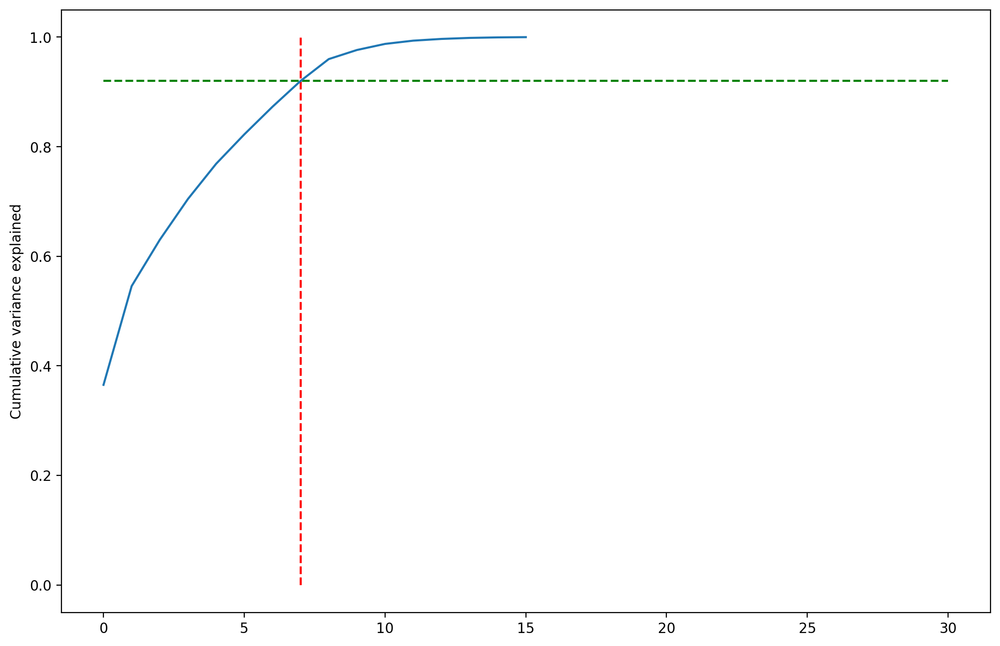

In [101]:
fig = plt.figure(figsize=[12,8],dpi=200)
plt.vlines(x=7, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.92, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [102]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=8)
X_pca_final = pca_final.fit_transform(X_scaled)

In [103]:
print(X.shape)
print(X_pca_final.shape)

(39542, 16)
(39542, 8)


In [104]:
corrmat = np.corrcoef(X_pca_final.transpose())

In [105]:
corrmat.shape

(8, 8)

<AxesSubplot:>

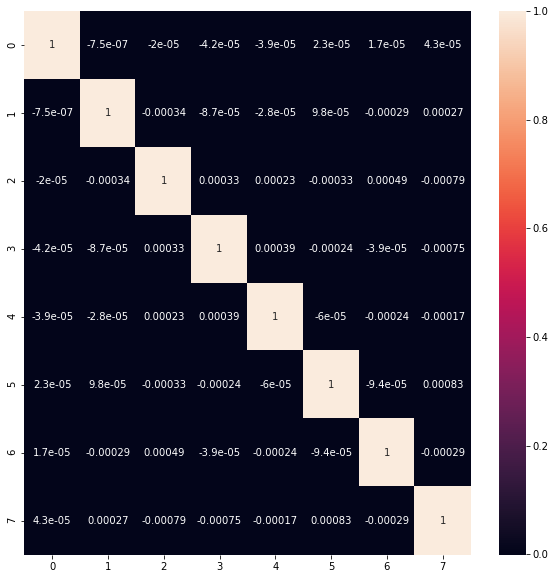

In [106]:
plt.figure(figsize=[10,10])
sns.heatmap(corrmat, annot=True)

In [107]:

colnames = list(X.columns)
pca_df = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1],'PC3':pca.components_[2],'PC4':pca.components_[3],'PC5':pca.components_[4],'PC6':pca.components_[5],'PC7':pca.components_[6],'PC8':pca.components_[7], 'Feature':colnames})
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Feature
0,0.399431,-0.041250,-0.034892,-0.013910,-0.025070,0.036929,-0.037494,0.096560,loan_amnt
1,0.404461,-0.041617,-0.042417,-0.030290,-0.038765,0.052544,-0.032014,0.079441,funded_amnt
2,0.147235,0.188411,0.111152,0.488907,0.323320,-0.499457,-0.228297,0.325936,term_new
3,0.137546,0.527252,-0.028066,0.069151,-0.065752,-0.120802,0.078863,-0.121709,int_rate_new
4,0.381986,-0.050333,-0.078286,-0.174077,-0.144778,0.192772,0.049751,-0.031254,installment


In [108]:
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,Feature
0,0.399431,-0.041250,-0.034892,-0.013910,-0.025070,0.036929,-0.037494,0.096560,loan_amnt
1,0.404461,-0.041617,-0.042417,-0.030290,-0.038765,0.052544,-0.032014,0.079441,funded_amnt
2,0.147235,0.188411,0.111152,0.488907,0.323320,-0.499457,-0.228297,0.325936,term_new
3,0.137546,0.527252,-0.028066,0.069151,-0.065752,-0.120802,0.078863,-0.121709,int_rate_new
4,0.381986,-0.050333,-0.078286,-0.174077,-0.144778,0.192772,0.049751,-0.031254,installment
5,0.121888,0.522933,-0.028660,0.056705,-0.092701,-0.139781,0.102374,-0.144817,grade_new
6,0.063899,-0.066736,0.411371,0.414000,-0.283684,0.250419,-0.498682,-0.489157,emp_length_new
7,0.047615,-0.111286,0.414969,0.398652,-0.339674,0.006088,0.610843,0.182879,home_ownership_new
8,0.075693,0.046553,-0.066025,0.314906,0.716654,0.499444,0.250692,-0.224827,verification_status_new
9,0.042761,0.112718,0.524883,-0.391265,0.278671,-0.049839,-0.301110,0.048451,dti


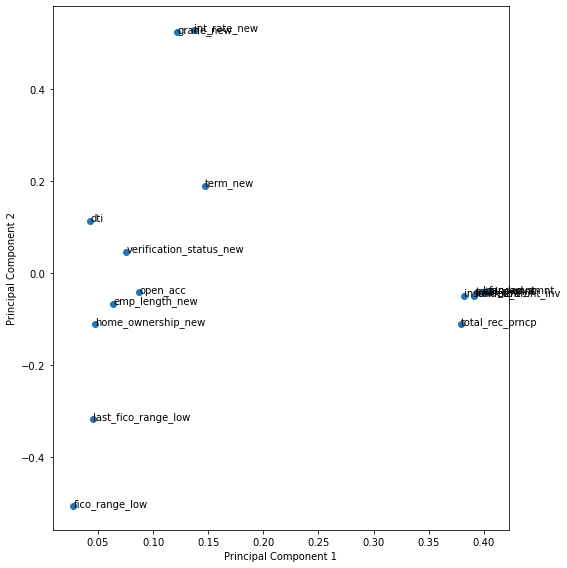

In [109]:
fig = plt.figure(figsize = (8,8))
plt.scatter(pca_df.PC1, pca_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pca_df.Feature):
    plt.annotate(txt, (pca_df.PC1[i],pca_df.PC2[i]))
plt.tight_layout()
plt.show()

In [110]:
## Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

In [111]:
kmeans = KMeans(n_clusters=2, max_iter=1000)
kmeans.fit(X_pca_final)

KMeans(max_iter=1000, n_clusters=2)

In [112]:
kmeans.labels_

array([1, 1, 1, ..., 1, 1, 1])

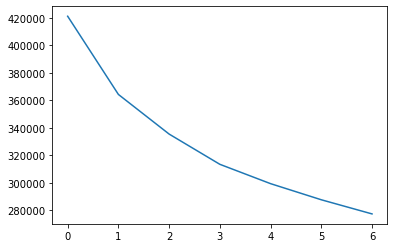

In [113]:
# metoda łokcia - elbow-curve
ssd = [] # Sum of squared distances
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    kmeans.fit(X_pca_final)
    
    ssd.append(kmeans.inertia_) #Sum of squared distances
    
# plot the SSDs for each n_clusters
# ssd
plt.plot(ssd)

Wg wykresu metody lokciowej ilosc klastrow wynosi 1 lub 2. SPrawdzam dla 2 klastrów.

In [114]:
# Miara wewnętrzna - wskaźnik sylwetkowy
# średnią odległość pomiędzy obserwacjami wewnątrz grupy (a) i średnią odległość obserwacji do najbliższej „obcej” grupy (b). 
# Silhouette obliczany jest dla każdej obserwacji w następujący sposób: (a – b)/max(a, b)

range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=1000)
    kmeans.fit(X_pca_final)
    
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(X_pca_final, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.2622271937622204
For n_clusters=3, the silhouette score is 0.18017932721643334
For n_clusters=4, the silhouette score is 0.15696482194625708
For n_clusters=5, the silhouette score is 0.1430265958109128
For n_clusters=6, the silhouette score is 0.13680737726743278
For n_clusters=7, the silhouette score is 0.1290818727752648
For n_clusters=8, the silhouette score is 0.1282720044850642


In [115]:
kmeans = KMeans(n_clusters=2, max_iter=1000, random_state=42)
kmeans.fit(X_pca_final)

KMeans(max_iter=1000, n_clusters=2, random_state=42)

In [116]:
df_outliers_removed['K-Means_Cluster_ID'] = kmeans.labels_

<ipython-input-116-ee094727f885>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_outliers_removed['K-Means_Cluster_ID'] = kmeans.labels_


In [117]:
df_outliers_removed.head()

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,term_new,grade_new,emp_length_new,home_ownership_new,verification_status_new,int_rate_new,last_fico_range_high_new,annual_inc_new,emp_length_new2,K-Means_Cluster_ID
0,0,5000.0,5000.0,4975.0,36 months,10.65%,162.87,B,B2,US Army,...,36,2,10,1,1,0.1065,3,1.0,4.0,1
2,2,2400.0,2400.0,2400.0,36 months,15.96%,84.33,C,C5,US Army,...,36,3,10,1,0,0.1596,3,1.0,4.0,1
3,3,10000.0,10000.0,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,...,36,3,10,1,2,0.1349,2,1.0,4.0,1
4,4,3000.0,3000.0,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,...,60,2,1,1,2,0.1269,3,2.0,1.0,1
5,5,5000.0,5000.0,5000.0,36 months,7.90%,156.46,A,A4,Veolia Transportaton,...,36,1,3,1,2,0.0790,1,1.0,2.0,1


<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='loan_amnt'>

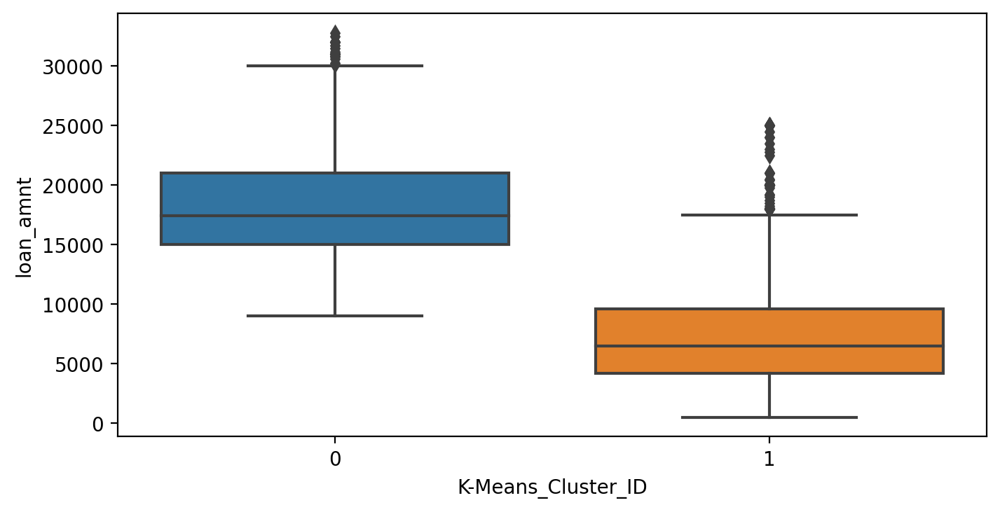

In [118]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='loan_amnt', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='funded_amnt'>

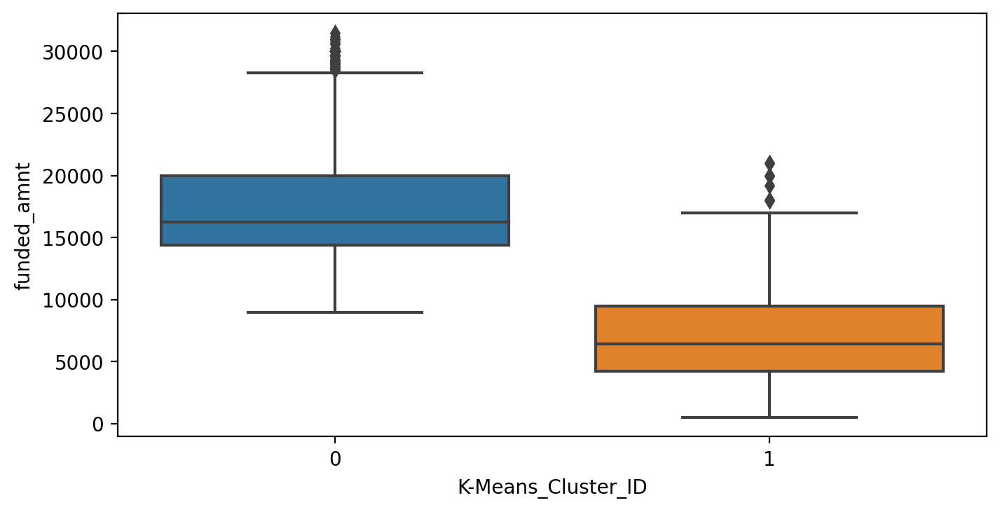

In [119]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='funded_amnt', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='term_new'>

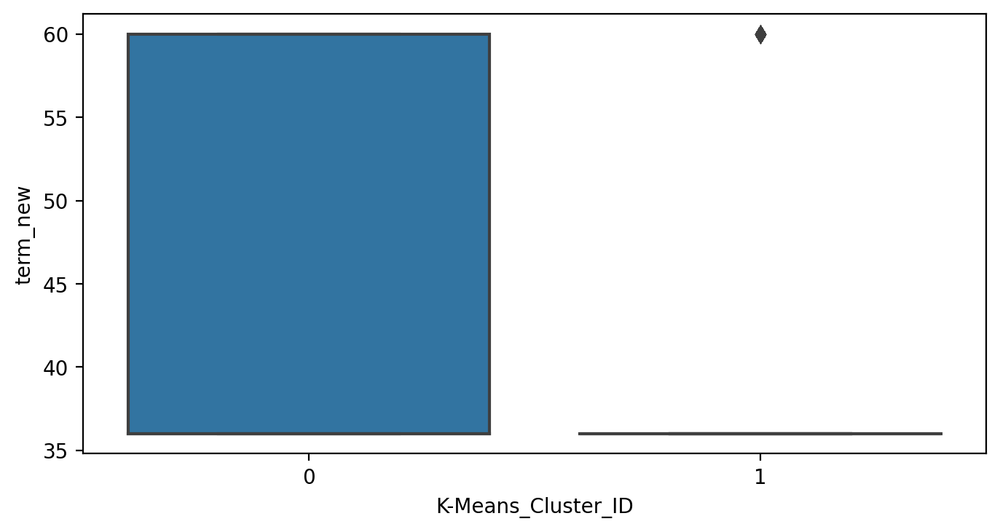

In [120]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='term_new', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='int_rate_new'>

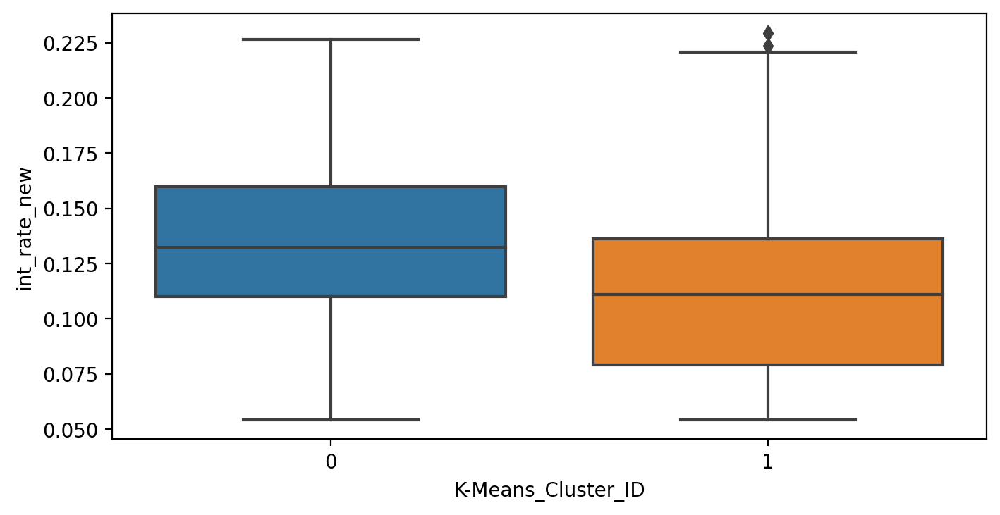

In [121]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='int_rate_new', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='installment'>

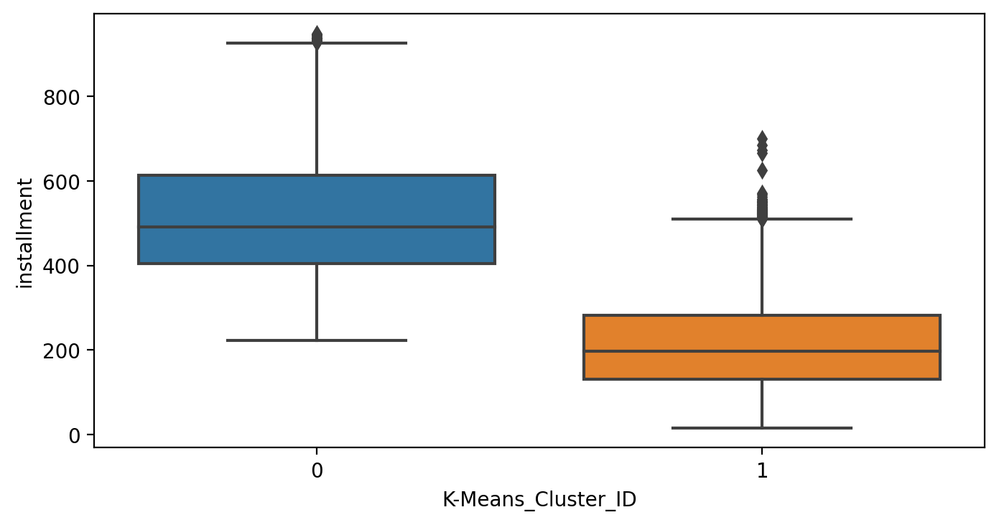

In [122]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='installment', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='grade_new'>

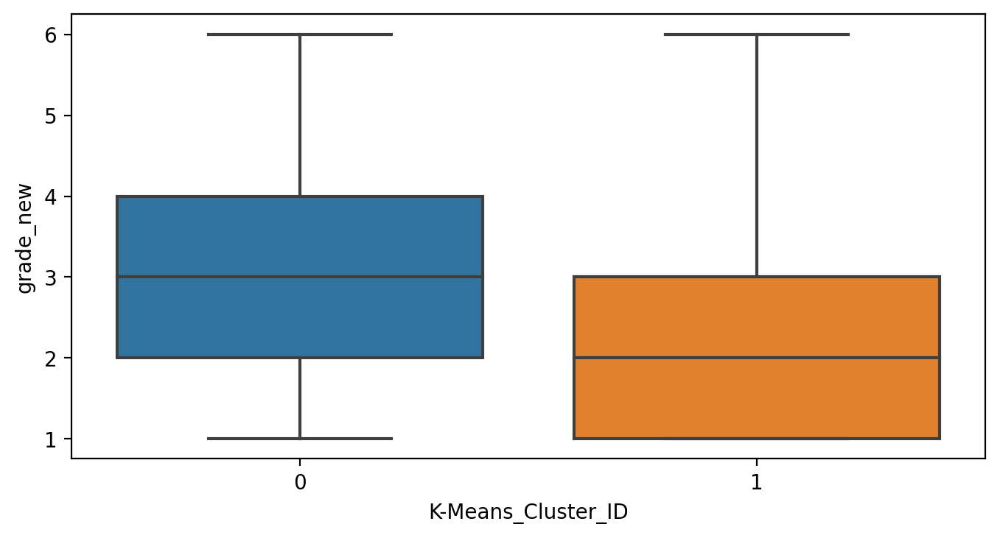

In [123]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='grade_new', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='emp_length_new'>

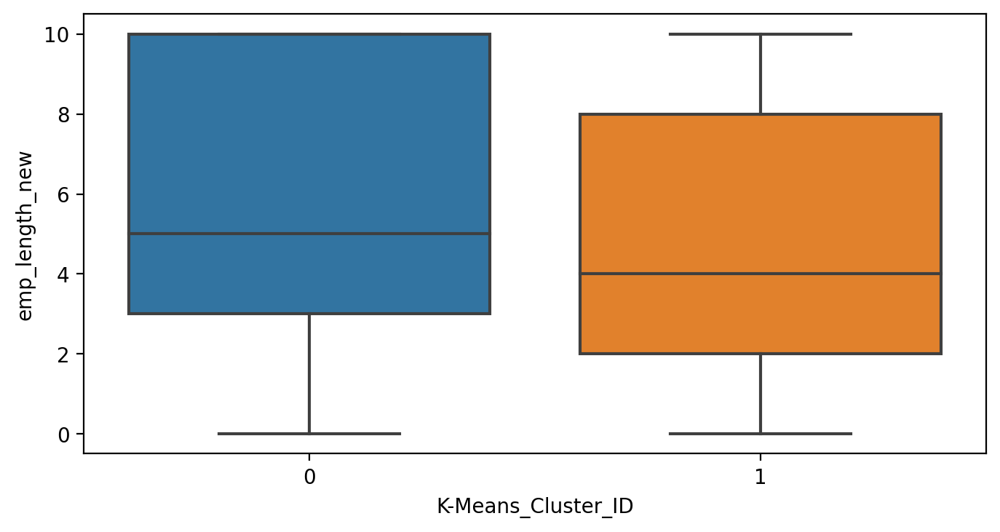

In [124]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='emp_length_new', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='home_ownership_new'>

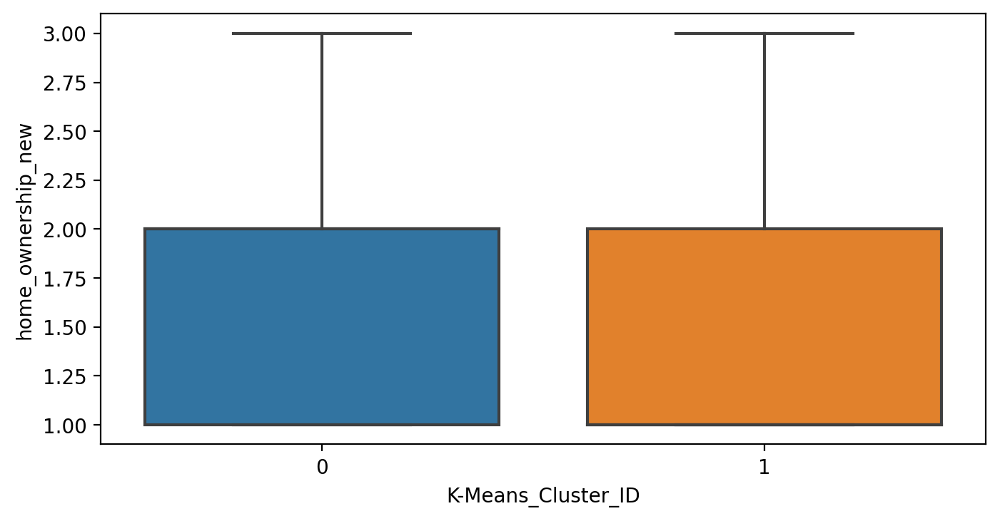

In [125]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='home_ownership_new', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='verification_status_new'>

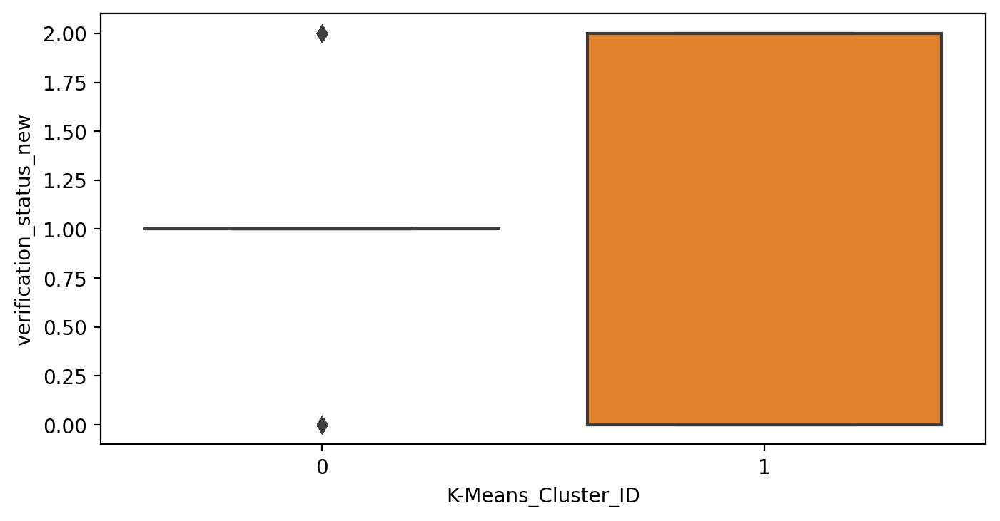

In [126]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='verification_status_new', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='dti'>

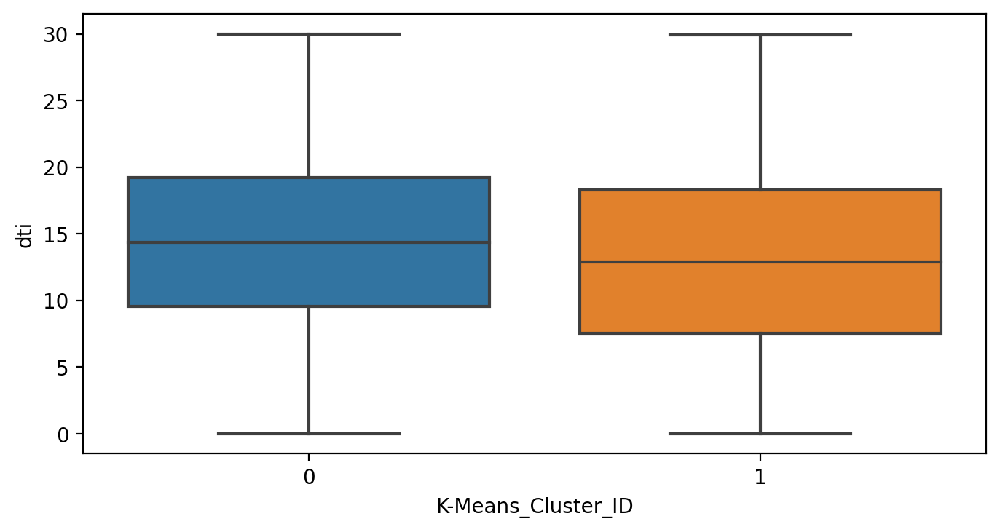

In [127]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='dti', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='fico_range_low'>

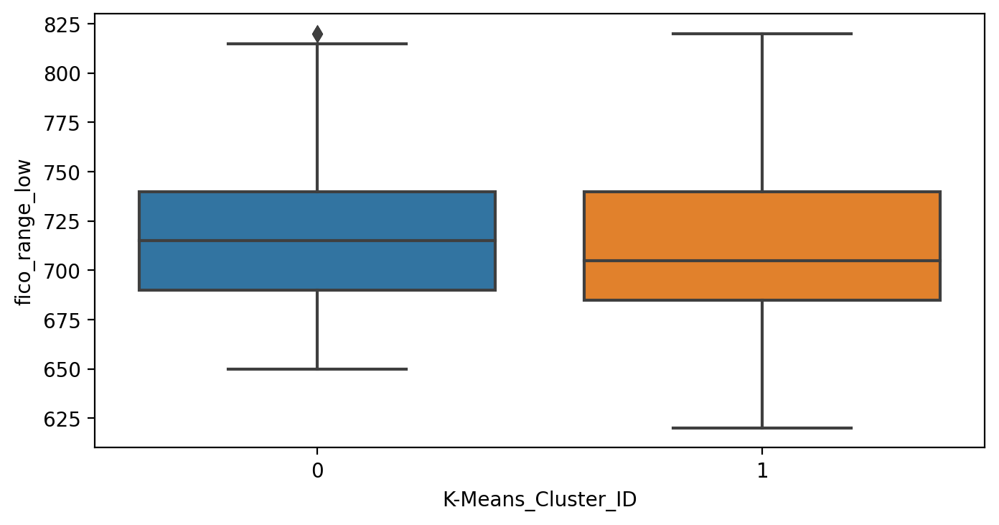

In [128]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='fico_range_low', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='open_acc'>

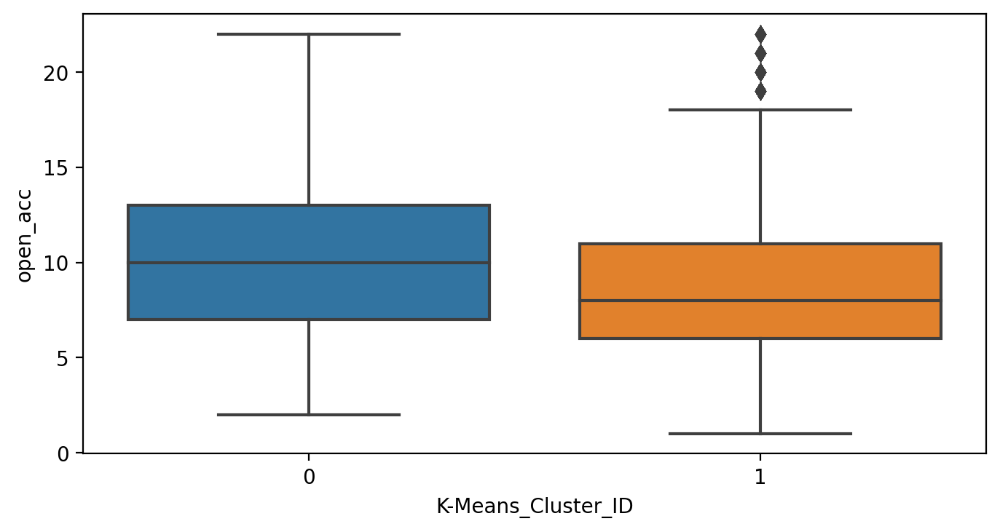

In [129]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='open_acc', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='open_acc'>

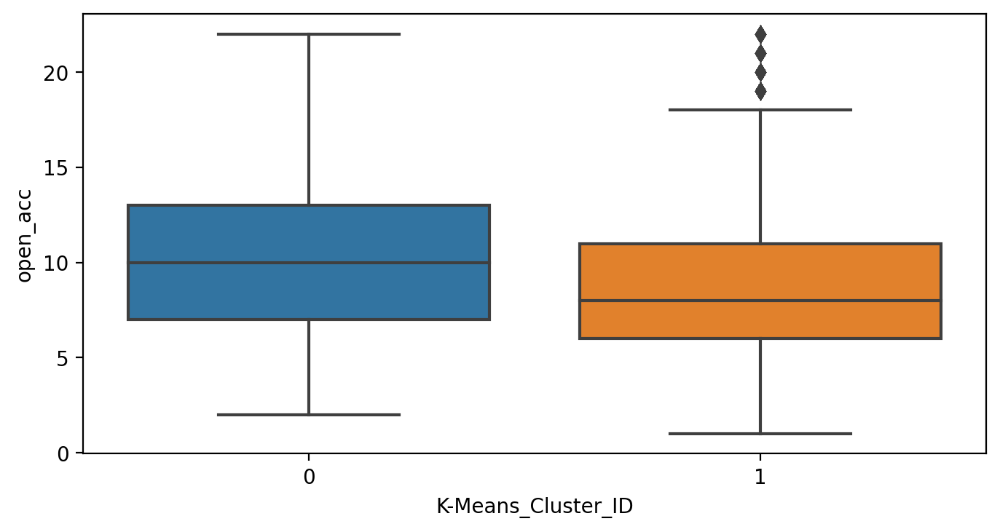

In [130]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='open_acc', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='total_pymnt'>

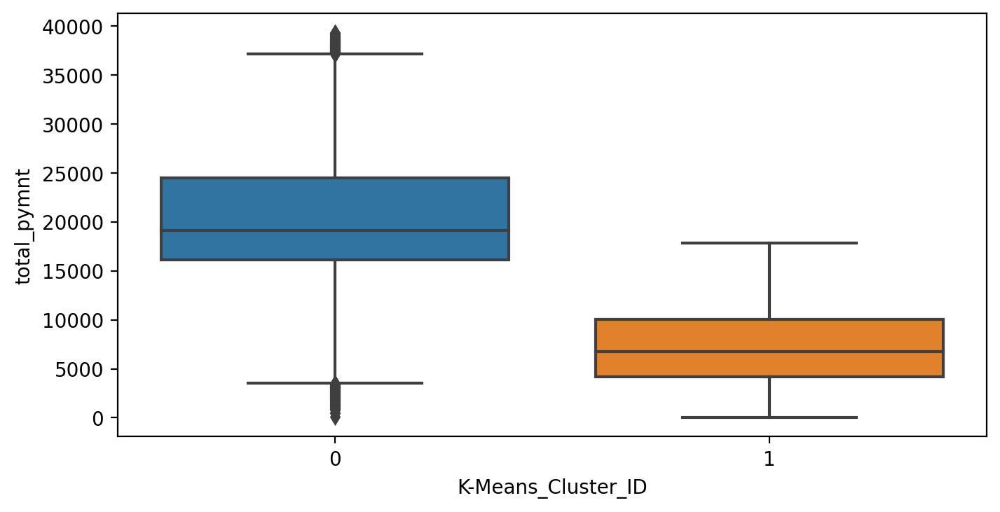

In [131]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='total_pymnt', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='total_rec_prncp'>

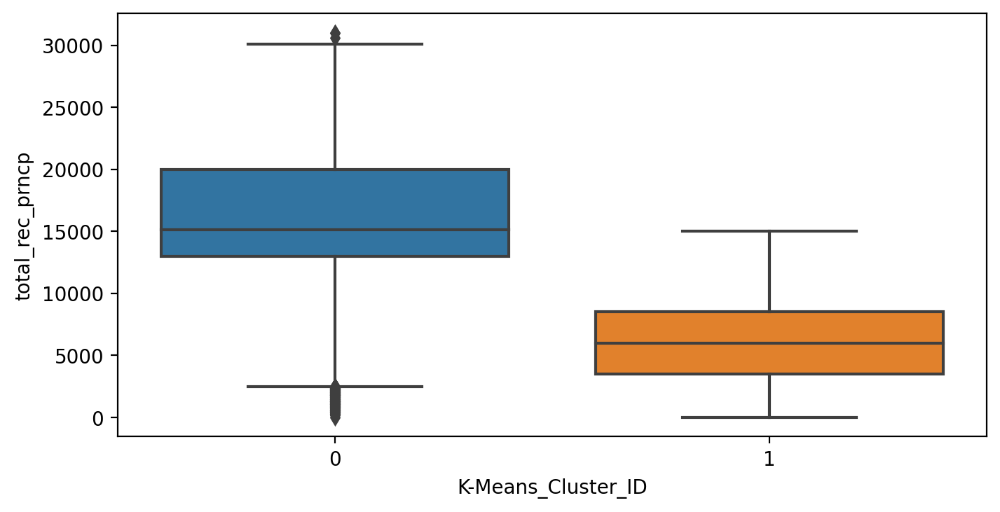

In [132]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='total_rec_prncp', data=df_outliers_removed)

<AxesSubplot:xlabel='K-Means_Cluster_ID', ylabel='last_fico_range_low'>

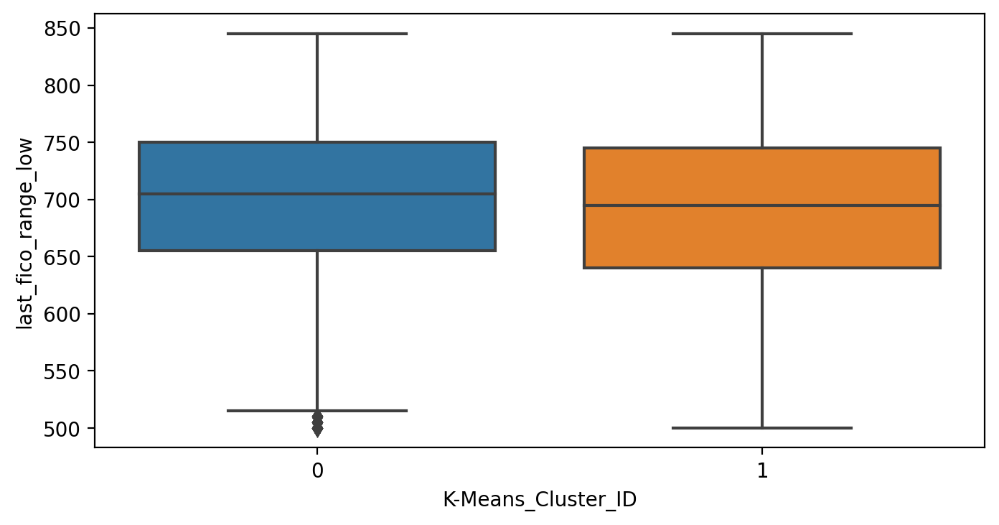

In [133]:
plt.figure(figsize=(8,4),dpi=200)
sns.boxplot(x='K-Means_Cluster_ID', y='last_fico_range_low', data=df_outliers_removed)

In [134]:
# 'loan_amnt', 'funded_amnt', 'term_new', 'int_rate_new', 'installment',
#        'grade_new', 'emp_length_new', 'home_ownership_new',
#        'verification_status_new', 'dti', 'fico_range_low', 'open_acc',
#        'total_pymnt', 'total_rec_prncp', 'last_fico_range_low'],
#       dtype='object')

In [135]:
X_scaled_df.head()

,loan_amnt,funded_amnt,term_new,int_rate_new,installment,grade_new,emp_length_new,home_ownership_new,verification_status_new,dti,fico_range_low,open_acc,total_pymnt,total_rec_prncp,last_fico_range_low,funded_amnt_inv
0,-0.843525,-0.835897,-0.56744,-0.351413,-0.770419,-0.417012,1.377437,-0.948859,0.255789,2.131662,0.587263,-1.488005,-0.702888,-0.678210,0.589564,-0.740851
1,-1.242662,-1.249469,-0.56744,1.149049,-1.189757,0.332817,1.377437,-0.948859,-0.979784,-0.687061,0.587263,-1.729586,-1.067006,-1.090428,0.589564,-1.151147
2,-0.075954,-0.040566,-0.56744,0.451094,0.171624,0.332817,1.377437,-0.948859,1.491361,0.992559,-0.662312,0.203067,0.108654,0.114517,-1.199845,0.059824
3,-1.150553,-1.154029,1.76230,0.225035,-1.278067,-0.417012,-1.118983,-0.948859,1.491361,0.685820,-0.523470,1.410976,-0.931776,-0.995300,-0.139454,-1.055544
4,-0.843525,-0.835897,-0.56744,-1.128489,-0.804643,-1.166842,-0.564223,-0.948859,1.491361,-0.317783,0.448421,-0.038514,-0.732316,-0.678210,-1.730040,-0.736867


In [136]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN

In [137]:
# Standarize features
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [138]:
clt = DBSCAN(eps=0.5, min_samples=1000)
model = clt.fit(X_std)

In [139]:
X_std.shape

(39542, 16)

In [140]:
# from sklearn.decomposition import PCA
# pca = PCA(n_components=2).fit(X_pca_final)
# pca_2d = pca.transform(X_pca_final)
# for i in range(0, pca_2d.shape[0]):
#     if clt.labels_[i] == 0:
#         c1 = plt.scatter(pca_2d[i,0],pca_2d[i,1],c='r', marker='+')
#     elif clt.labels_[i] == 1:
#         c2 = plt.scatter(pca_2d[i,0],pca_2d[i,1],c='g', marker='o')
#     elif clt.labels_[i] == -1:
#             c3 = plt.scatter(pca_2d[i,0],pca_2d[i,1],c='b', marker='*')
# plt.legend([c1, c2, c3], ['Cluster 1', 'Cluster 2', 'Noise'])
# plt.title('DBSCAN finds 2 clusters and noise')
# plt.show()

In [141]:
# # single linkage
# sl_mergings = linkage(X_scaled_df, method="single", metric='euclidean')
# dendrogram(sl_mergings)
# plt.show()

In [142]:
# # complete linkage
# cl_mergings = linkage(X_scaled_df, method="complete", metric='euclidean')
# dendrogram(cl_mergings)
# plt.show()

In [143]:
# sl_cluster_labels = cut_tree(sl_mergings, n_clusters=4).reshape(-1, )
# sl_cluster_labels

In [144]:
# # 4 klastry z single linkge
# sl_cluster_labels = cut_tree(sl_mergings, n_clusters=4).reshape(-1, )
# sl_cluster_labels

In [145]:
# # 4 klastry z complete linkage
# cl_cluster_labels = cut_tree(cl_mergings, n_clusters=4).reshape(-1, )
# cl_cluster_labels

In [146]:
# df_outliers_removed["Hierarchical_Cluster_labels"] = cl_cluster_labels

In [147]:
# sl_mergings = linkage(X_scaled_df, method="single", metric='euclidean')

In [148]:
# Modelowanie - Decision Tree

In [193]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score


In [151]:
X = df2_outliers_removed 
y = new_df.drop(['Unnamed: 0'], axis=1)

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=42)

In [107]:
# Decision Tree

In [153]:
from sklearn.tree import DecisionTreeClassifier

In [154]:
dtree = DecisionTreeClassifier()

In [155]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [156]:
def evaluate(prediction,y_test): 
    result = classification_report(y_test,prediction,output_dict=True)
    f1 = result['1']['f1-score']
    accuracy = result['accuracy']
    performance_data= {'f1-score':round(f1, 2),
                      'accuracy':round(accuracy, 2)}
    return performance_data

In [198]:
dt_prediction = dtree.predict(X_test)

In [201]:
print(roc_auc_score(y_test,dt_prediction))

0.9833430953724352


In [158]:
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import precision_score

In [159]:
print(classification_report(y_test,dt_prediction))

dtree_pr= evaluate(dt_prediction,y_test)
dtree_pr

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1638
           1       1.00      1.00      1.00     10225

    accuracy                           0.99     11863
   macro avg       0.98      0.98      0.98     11863
weighted avg       0.99      0.99      0.99     11863



{'f1-score': 1.0, 'accuracy': 0.99}

3] <= 0.056\ngini = 0.03\nsamples = 198\nvalue = [3, 195]'),
 Text(172.4258660508083, 102.67999999999999, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(175.51870669745958, 102.67999999999999, 'X[9] <= 1.66\ngini = 0.02\nsamples = 197\nvalue = [2, 195]'),
 Text(172.4258660508083, 90.6, 'X[9] <= 1.645\ngini = 0.198\nsamples = 9\nvalue = [1, 8]'),
 Text(170.87944572748268, 78.52000000000001, 'gini = 0.0\nsamples = 8\nvalue = [0, 8]'),
 Text(173.97228637413394, 78.52000000000001, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(178.61154734411085, 90.6, 'X[2] <= 48.0\ngini = 0.011\nsamples = 188\nvalue = [1, 187]'),
 Text(177.0651270207852, 78.52000000000001, 'gini = 0.0\nsamples = 167\nvalue = [0, 167]'),
 Text(180.15796766743648, 78.52000000000001, 'X[0] <= 3450.0\ngini = 0.091\nsamples = 21\nvalue = [1, 20]'),
 Text(178.61154734411085, 66.44, 'gini = 0.0\nsamples = 18\nvalue = [0, 18]'),
 Text(181.70438799076211, 66.44, 'X[1] <= 3550.0\ngini = 0.444\nsamples = 3\nvalue = [1, 2]'),


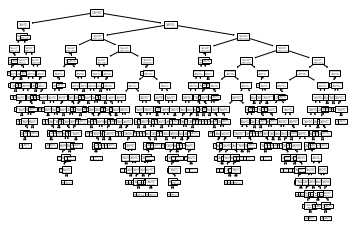

In [115]:
from sklearn import tree
tree.plot_tree(dtree)

In [116]:
# Random Forest

In [203]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)

<ipython-input-203-b22e6acfc5d5>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train, y_train)


RandomForestClassifier()

In [204]:
rf_prediction = rf.predict(X_test)

In [205]:
print(roc_auc_score(y_test,rf_prediction))

0.9682539682539683


In [162]:
print(classification_report(y_test,rf_prediction))
rf_pr = evaluate(rf_prediction,y_test)
print(rf_pr)

              precision    recall  f1-score   support

           0       1.00      0.93      0.96      1638
           1       0.99      1.00      0.99     10225

    accuracy                           0.99     11863
   macro avg       0.99      0.97      0.98     11863
weighted avg       0.99      0.99      0.99     11863

{'f1-score': 0.99, 'accuracy': 0.99}


Support Vector Machine (SVM)

In [206]:
from sklearn.svm import SVC #SVR
model = SVC()

In [207]:
model.fit(X_train,y_train)

C:\Users\Aldona\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


SVC()

In [208]:
svm_prediction = model.predict(X_test)

In [209]:
print(roc_auc_score(y_test,svm_prediction))

0.9652014652014652


In [210]:
from sklearn.metrics import classification_report,confusion_matrix

In [211]:
print(classification_report(y_test,svm_prediction))
svm_pr = evaluate(svm_prediction,y_test)
svm_pr

              precision    recall  f1-score   support

           0       1.00      0.93      0.96      1638
           1       0.99      1.00      0.99     10225

    accuracy                           0.99     11863
   macro avg       0.99      0.97      0.98     11863
weighted avg       0.99      0.99      0.99     11863



{'f1-score': 0.99, 'accuracy': 0.99}

REgresja logistyczna

In [214]:
from sklearn.datasets import fetch_openml
from sklearn.linear_model import LogisticRegression

In [215]:
logisticRegr = LogisticRegression(solver = 'lbfgs')

In [216]:
logisticRegr.fit(X_train,y_train)

C:\Users\Aldona\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\Users\Aldona\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [217]:
score = logisticRegr.score(X_test,y_test)
print(score)

0.9998314085813033


In [218]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix

In [219]:
predictions = logisticRegr.predict(X_test)

In [230]:
print(roc_auc_score(y_test,predictions))

0.6674844389514316


In [221]:
predictions = model.predict(X_test)
accuracy = metrics.accuracy_score(predictions, y_test)
print("Accuracy : %s" % "{0:.3%}".format(accuracy))

Accuracy : 99.039%


In [222]:
confusion_matrix(y_test, predictions)

array([[ 1524,   114],
       [    0, 10225]], dtype=int64)

In [223]:
# Sprawdź działanie wcześniej użytych metod na skompresowanych danych za pomocą PCA, porównaj wyniki (AUROC score) z modelami wytrenowanymi w poprzednim podpunkcie. (20pkt)
X_pca_final.shape

(39542, 8)

In [224]:
y.shape

(39542, 1)

In [225]:
X_pca_final_train, X_pca_final_test, y_train, y_test = train_test_split(X_pca_final, y, test_size=0.30,random_state=42)

In [226]:
logisticRegr = LogisticRegression(solver = 'lbfgs')
logisticRegr.fit(X_pca_final_train,y_train)

C:\Users\Aldona\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


LogisticRegression()

In [227]:
score = logisticRegr.score(X_pca_final_test, y_test)
print(score)

0.8788670656663575


In [228]:
predictions = logisticRegr.predict(X_pca_final_test)

In [231]:
print(roc_auc_score(y_test,predictions))

0.6674844389514316


In [183]:

accuracy = metrics.accuracy_score(predictions, y_test)
print("Accuracy : %s" % "{0:.3%}".format(accuracy))

Accuracy : 87.887%


In [184]:
confusion_matrix(y_test, predictions)

array([[ 615, 1023],
       [ 414, 9811]], dtype=int64)

In [234]:
# Random Forest dla PCA
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_pca_final_train, y_train)

<ipython-input-234-43ae924f8a02>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_pca_final_train, y_train)


RandomForestClassifier()

In [235]:
rf_prediction = rf.predict(X_pca_final_test)

In [236]:
print(roc_auc_score(y_test,rf_prediction))

0.6536311501592675


In [187]:
print(classification_report(y_test,rf_prediction))
rf_pr = evaluate(rf_prediction,y_test)
print(rf_pr)

              precision    recall  f1-score   support

           0       0.63      0.34      0.45      1638
           1       0.90      0.97      0.93     10225

    accuracy                           0.88     11863
   macro avg       0.77      0.66      0.69     11863
weighted avg       0.87      0.88      0.87     11863

{'f1-score': 0.93, 'accuracy': 0.88}


In [188]:
accuracy = metrics.accuracy_score(rf_prediction, y_test)
print("Accuracy : %s" % "{0:.3%}".format(accuracy))

Accuracy : 88.199%


In [189]:
confusion_matrix(y_test, rf_prediction)

array([[ 565, 1073],
       [ 327, 9898]], dtype=int64)

C:\Users\Aldona\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


0.9999975794869079